# Libraries and Data Information

## Installations

### Mount Google Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Create Virtual Environment.

In [2]:
# You might be required to create a virtual environment to install the packages
# depending on your Colab.
#!python -m venv /content/drive/My Drive/my_env  # Store in your Drive

### Activate Environment

In [3]:
# Make sure to activate that environment
!source /content/drive/My Drive/my_env/bin/activate

/bin/bash: line 1: /content/drive/My: No such file or directory


### Install Packages.

In [4]:
# The following packages shown below will be reinstalled for compatibility
!pip install numpy
#!pip install numpy==1.24.3
!pip install scipy==1.10.0
!pip install scikit-learn
!pip install tensorflow
!pip install torch

In [5]:
#!pip install keras-spiking==0.1.1

In [6]:
# Other Installations. After this please Restart and Run All cells
# (Runtime -> Restart session and run all)
#!pip install numpy
!pip install numpy.rec # Install numpy.rec for compatibility.
#!pip install scipy==1.10.0
#!pip install keras_spiking --upgrade
!pip install keras_spiking
!pip install nengo==3.2.0

ERROR: Could not find a version that satisfies the requirement numpy.rec (from versions: none)
ERROR: No matching distribution found for numpy.rec


Testing if they work.

In [7]:
import numpy as np
import scipy as sp
import sklearn
import tensorflow as tf
import nengo
import nengo.spa as spa
import torch
import keras_spiking

print("NumPy version:", np.__version__)
print("SciPy version:", sp.__version__)
#print("scikit-learn version:", sklearn.__version__)
print("TensorFlow version:", tf.__version__)
print("PyTorch version:", torch.__version__)

NumPy version: 1.26.4
SciPy version: 1.10.0
TensorFlow version: 2.18.0
PyTorch version: 2.6.0+cu124


## Libraries

In [8]:
#matplotlib imports
import matplotlib.pyplot as plt
import matplotlib.pyplot as scatter
import matplotlib.cm as cm


# sklearn imports
import sklearn
print(f"Scikit-learn version: {sklearn.__version__}")
from sklearn.preprocessing import MinMaxScaler, StandardScaler, MaxAbsScaler
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_percentage_error
print(f"Scikit-learn version: {sklearn.__version__}")

# keras/tensorflow imports
import tensorflow as tf
from keras.layers import Dense, Dropout, SimpleRNN, LSTM, GRU, Flatten, Conv1D
from keras.layers import MaxPooling1D
from keras.models import Sequential
import keras
from sklearn.model_selection import GridSearchCV


# warnings imports
import warnings
warnings.filterwarnings("ignore")

# torch imports
import torch
import torch.nn as nn
from torchvision import transforms
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"{device}" " is available.")

# spikingjelly imports
#from spikingjelly.clock_driven import neuron, surrogate
#from spikingjelly.clock_driven import accelerating
#import spikingjelly.clock_driven.neuron as sj


# Other imports
from urllib.request import urlretrieve
import collections
import pandas as pd
from math import sqrt
import os
import pickle
from datetime import datetime, timedelta
from google.colab import drive

Scikit-learn version: 1.6.1
Scikit-learn version: 1.6.1
cpu is available.


# Load Data

In [9]:
# Please obtain pems_time_series_traffic_Q.csv
from google.colab import files, runtime
data_to_load = files.upload()

Saving pems_time_series_traffic_Q.csv to pems_time_series_traffic_Q.csv


# Read and Check Data

## Preprocessing stage.

In [10]:
# List all keys.
filename_list = list(data_to_load.keys())
filename = filename_list[0]

In [11]:
# Turn csv to dataframe (df).
df = pd.read_csv(filename)
df.head()

,Hour,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
0,3/6/2023 0:00,"4,730,945.90","71,292.80",66.359379,430583,55.0
1,3/6/2023 1:00,"3,539,705.60","53,661.00",65.964212,430728,55.0
2,3/6/2023 2:00,"3,303,421.80","50,292.40",65.684314,430476,54.9
3,3/6/2023 3:00,"4,293,866.20","65,046.60",66.012154,430728,54.9
4,3/6/2023 4:00,"7,919,316.80","119,801.60",66.103598,430728,54.8


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8795 entries, 0 to 8794
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Hour             8795 non-null   object 
 1   VMT (Veh-Miles)  8795 non-null   object 
 2   VHT (Veh-Hours)  8795 non-null   object 
 3   Q (VMT/VHT)      8795 non-null   float64
 4   # Lane Points    8795 non-null   int64  
 5   % Observed       8795 non-null   float64
dtypes: float64(2), int64(1), object(3)
memory usage: 412.4+ KB


In [13]:
title_name = 'CalTrans PeMS Data from 03-06-2023 to 03-06-2024'

In [14]:
df['VMT (Veh-Miles)'] = [float(str(i).replace(",", "")) for i in df['VMT (Veh-Miles)']]
df['VHT (Veh-Hours)'] = [float(str(i).replace(",", "")) for i in df['VHT (Veh-Hours)']]

## Other Pre-Processing Information

In [15]:
# Convert Datetime column to Datetime format.
df['Hour'] = pd.to_datetime(df['Hour'])

# Index the Datetime column after transformation.
df.set_index('Hour', inplace=True)
df.head()

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8


In [16]:
df.isna().sum()   # Check missing data.

,0
VMT (Veh-Miles),0
VHT (Veh-Hours),0
Q (VMT/VHT),0
# Lane Points,0
% Observed,0


* As can be seen, there are no missing values in our data
* Now let's observe our data set on the graph

In [17]:
# Let's look at the years in the data set.
years = df.index.year.unique()
years

Index([2023, 2024], dtype='int32', name='Hour')

In [18]:
# Print % Observed per year.
df_yr_obs = df['% Observed'].resample('Y').mean()
df_yr_obs.to_frame()

,% Observed
Hour,
2023-12-31,52.018206
2024-12-31,52.886260


In [19]:
# Print # Lane Points.
df_yr_lane_pts = df['# Lane Points'].resample('Y').mean()
df_yr_lane_pts.to_frame()

,# Lane Points
Hour,
2023-12-31,436930.190503
2024-12-31,444306.233461


In [20]:
# Obtain Vehicle Miles Traveled (VMT) for each year.
df_yr_avg_vmt = df['VMT (Veh-Miles)'].resample('Y').mean()
df_yr_avg_vmt.to_frame()

,VMT (Veh-Miles)
Hour,
2023-12-31,1.664968e+07
2024-12-31,1.608081e+07


In [21]:
# Obtain Vehicle Hours Traveled (VMT) for each year.
df_yr_avg_vht = df['VHT (Veh-Hours)'].resample('Y').mean()
df_yr_avg_vht.to_frame()

,VHT (Veh-Hours)
Hour,
2023-12-31,285529.216904
2024-12-31,275036.663677


In [22]:
# Obtain Q or efficiency Measurement (VMT/VHT) for each year.
df_yr_avg_vmt = df['Q (VMT/VHT)'].resample('Y').mean()
df_yr_avg_vmt.to_frame()

,Q (VMT/VHT)
Hour,
2023-12-31,60.974523
2024-12-31,61.079063


## Plot Vehicle-Miles Traveled, Vehicle-Hours Traveled, Q based on Trends and Seasonality.

Note: Seasonality Plots will be daily, weekly, and monthly.

In [23]:
# Plotting Vehicle Miles and Vehicle Hours Travelled in One Plot.
def plot_veh_mi_hrs(select_df, start, end, seasonality, title_name):
  fig1, ax11 = plt.subplots(figsize=(16, 16))
  ax12 = ax11.twinx()
  ax11.plot(select_df['VMT (Veh-Miles)'][start:end], color='blue',
            label='Vehicle Miles')
  ax11.set_ylabel("Vehicle Miles", fontsize = 20)
  ax11.set_xlabel("Hour", fontsize = 20)
  ax12.plot(select_df['VHT (Veh-Hours)'][start:end], alpha=0.7, color='orange',
            label='Vehicle Hours')
  ax12.set_ylabel("Vehicle Hours", fontsize = 20)
  plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
  plt.title("Vehicle Miles and Hours for {0} ({1})".
            format(title_name, seasonality), fontsize = 20)
  plt.show()

# Plot VMT, VHT, or Q in seperate plots.
def plot_veh_mi_hrs_Q(select_df, start, end, seasonality, title_name, feature):
    plt.figure(figsize=(16, 16))
    plt.plot(select_df[start:end], label=feature)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.rc('xtick', labelsize=20)
    plt.rc('ytick', labelsize=20)
    plt.ylabel(feature, fontsize = 20)
    plt.xlabel("Hour", fontsize = 20)
    plt.title("{0} for {1} ({2})".format(feature, title_name, seasonality),
              fontsize = 20)
    plt.show()

### Yearly Plots (Trend)

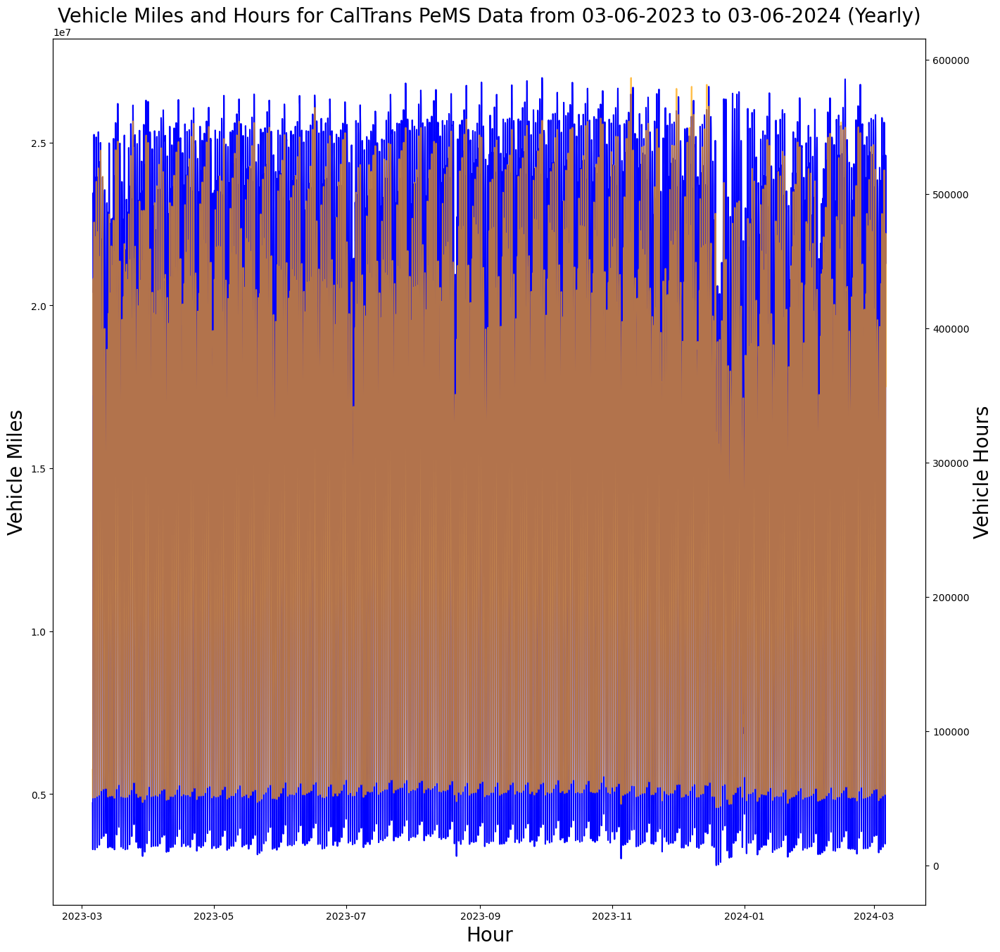

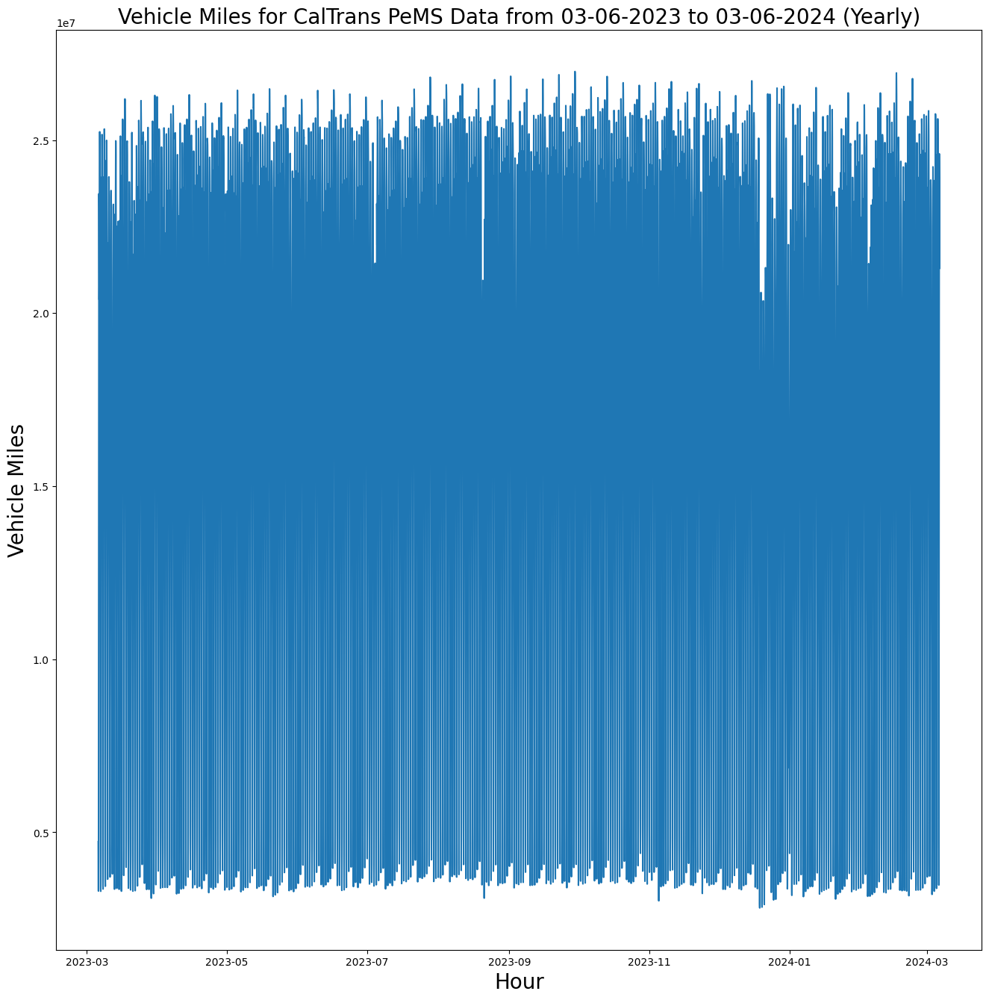

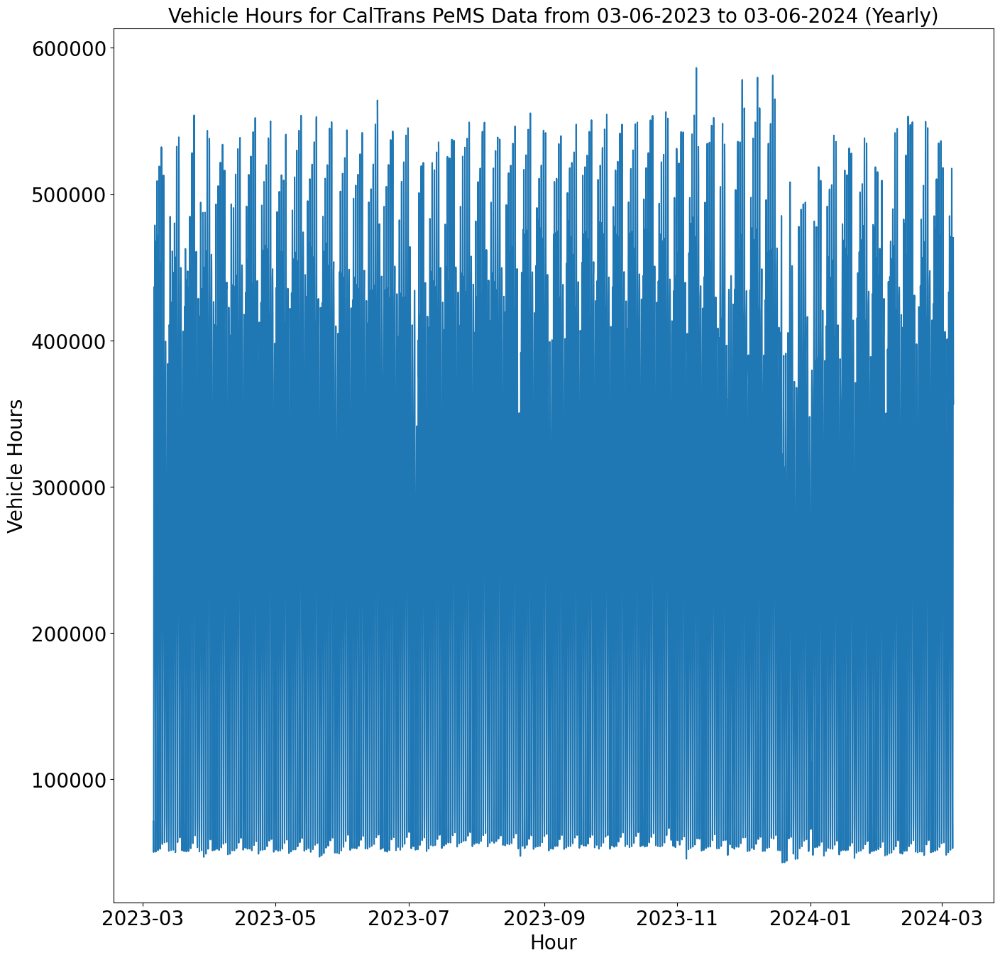

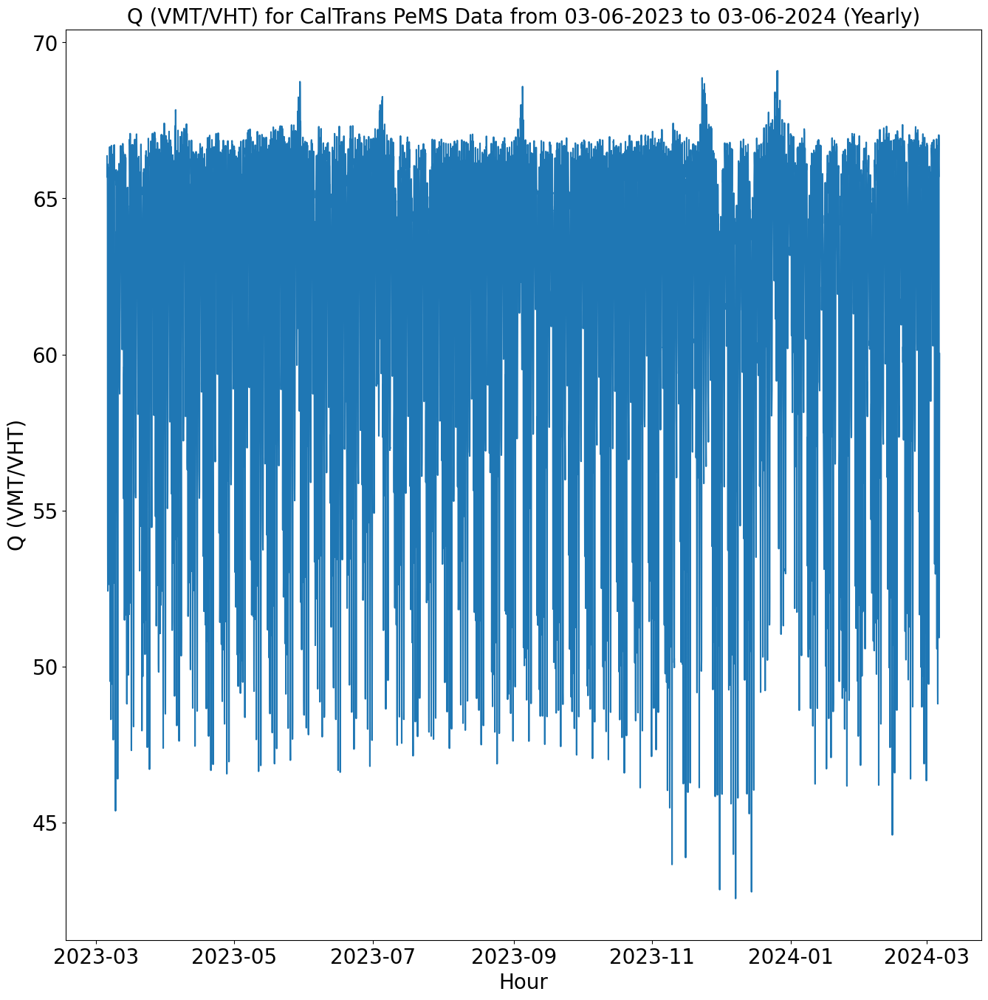

In [24]:
plot_veh_mi_hrs(df, 0, df.shape[0], "Yearly", title_name)
plot_veh_mi_hrs_Q(df['VMT (Veh-Miles)'], 0, df.shape[0], "Yearly", title_name,
                  'Vehicle Miles')
plot_veh_mi_hrs_Q(df['VHT (Veh-Hours)'], 0, df.shape[0], "Yearly", title_name,
                  'Vehicle Hours')
plot_veh_mi_hrs_Q(df['Q (VMT/VHT)'], 0, df.shape[0], "Yearly", title_name,
                  'Q (VMT/VHT)')

### Daily Plots (Seasonality)

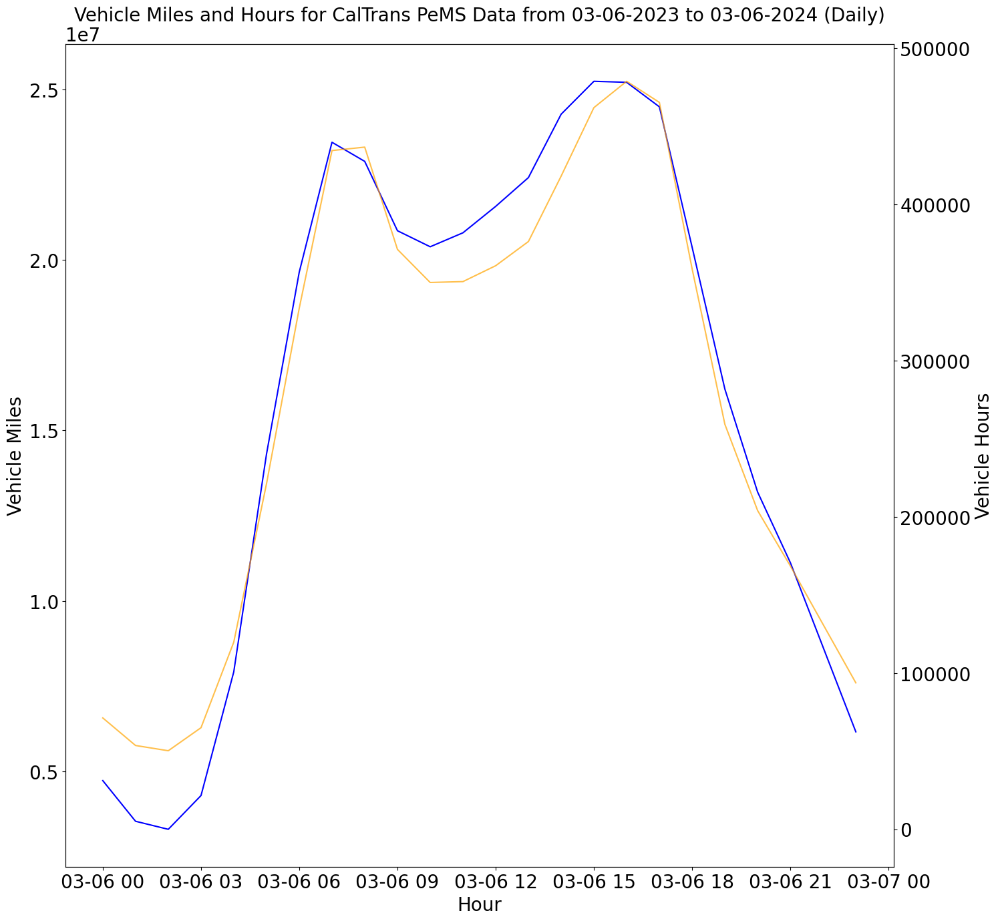

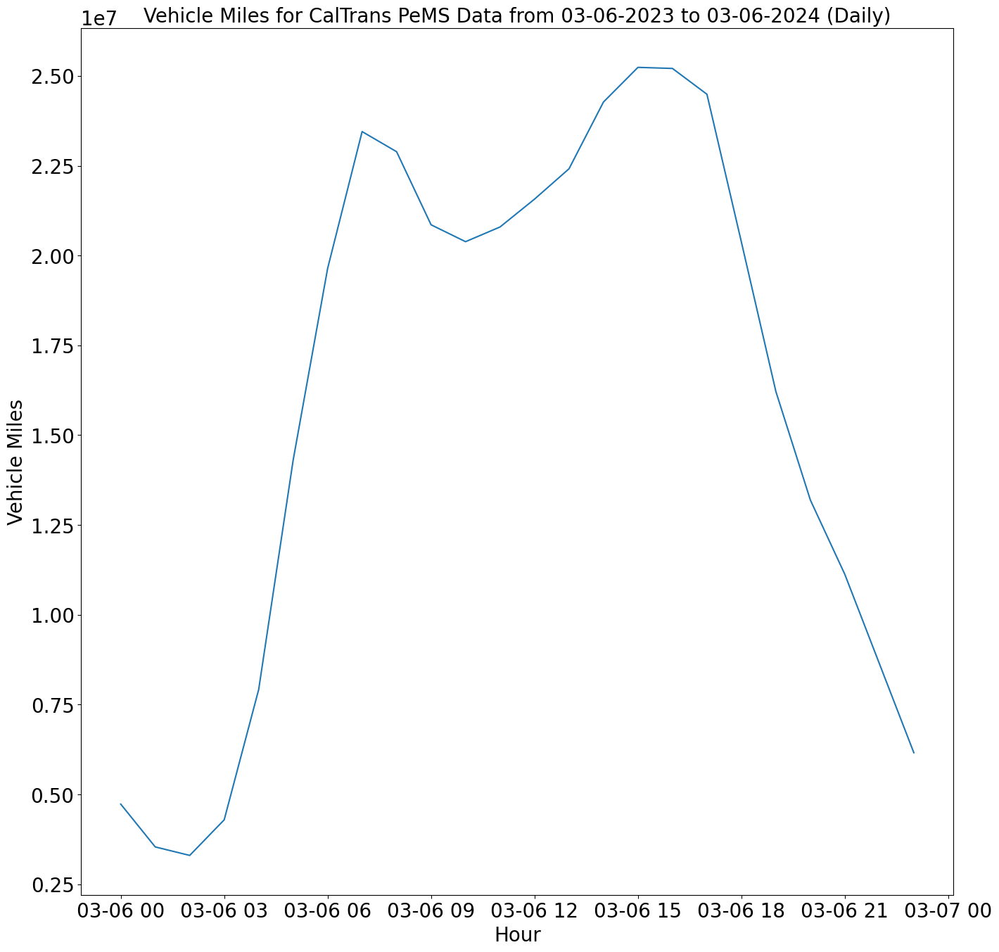

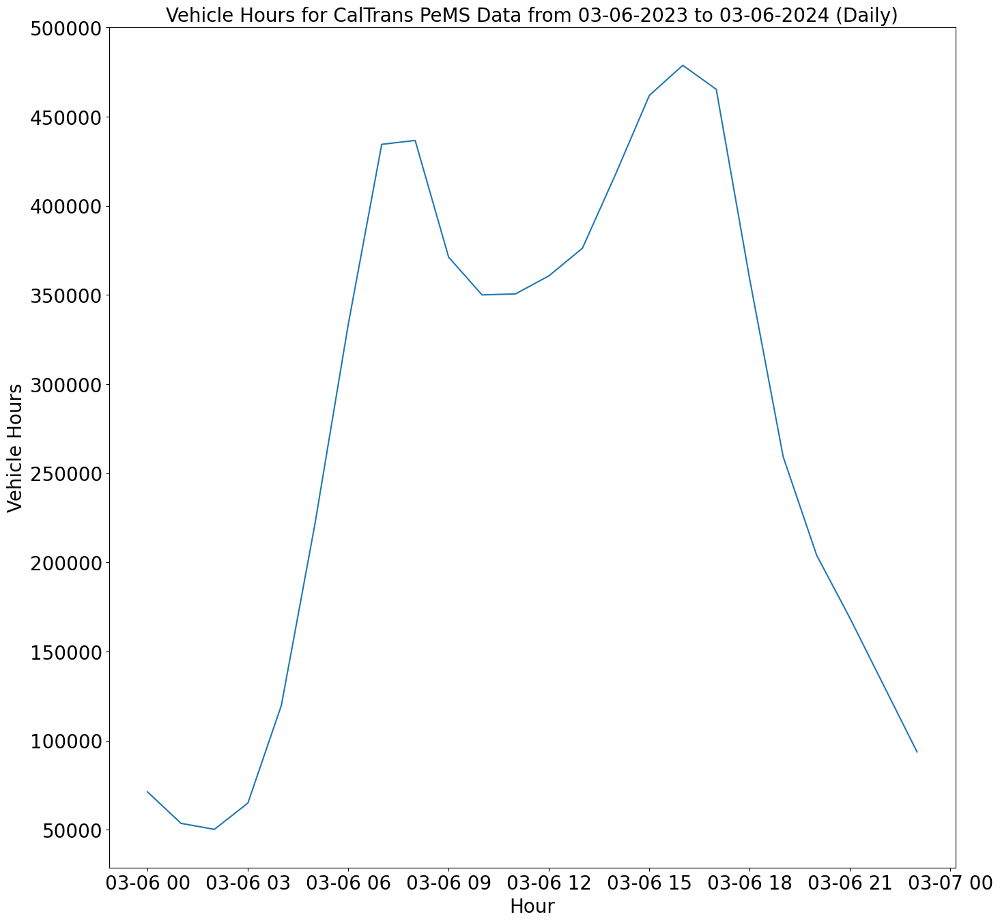

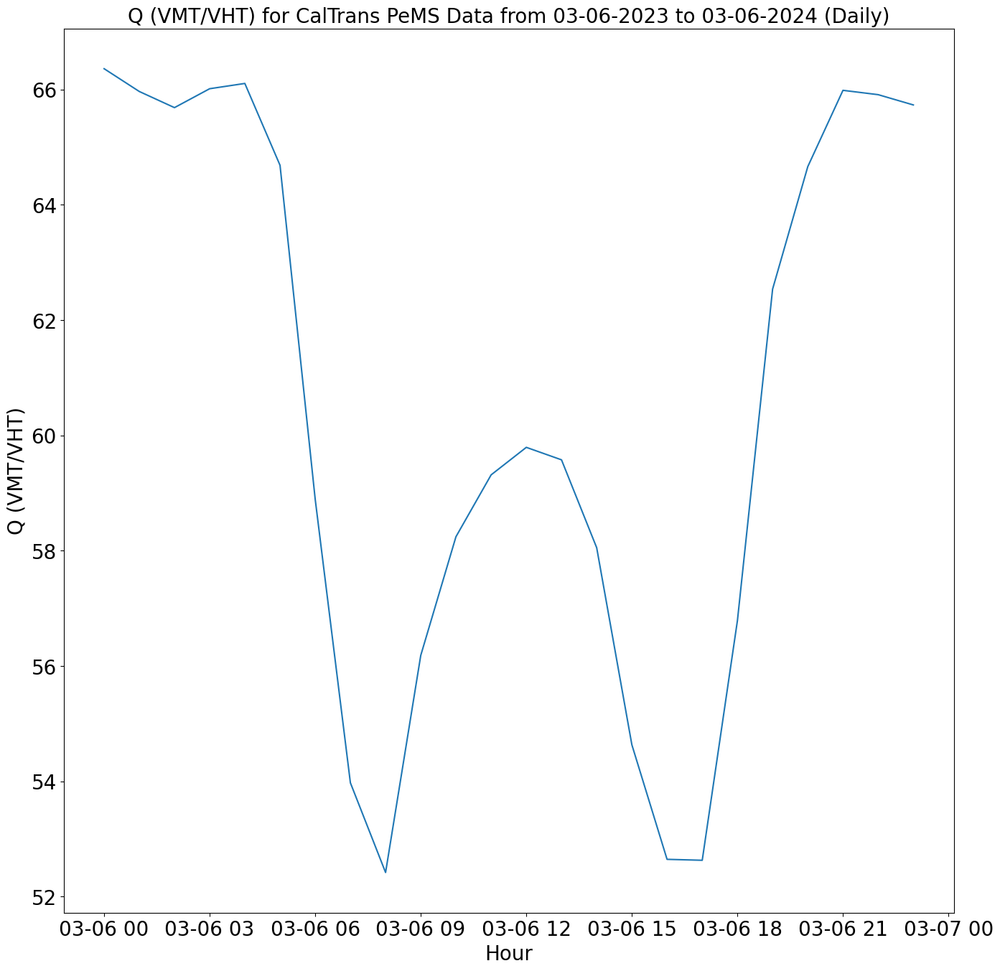

In [25]:
plot_veh_mi_hrs(df, 0, 24, "Daily", title_name)
plot_veh_mi_hrs_Q(df['VMT (Veh-Miles)'], 0, 24, "Daily", title_name,
                  'Vehicle Miles')
plot_veh_mi_hrs_Q(df['VHT (Veh-Hours)'], 0, 24, "Daily", title_name,
                  'Vehicle Hours')
plot_veh_mi_hrs_Q(df['Q (VMT/VHT)'], 0, 24, "Daily", title_name, 'Q (VMT/VHT)')

### Weekly Plots (Seasonality)

In [26]:
weekly_df = df.query("Hour >= '2023-04-09' \
                       and Hour <= '2023-04-16'")
weekly_df

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-04-09 00:00:00,7338493.3,109208.5,67.197089,431550,57.0
2023-04-09 01:00:00,5093904.2,76290.6,66.769749,431640,57.0
2023-04-09 02:00:00,4049969.8,60785.5,66.627235,431640,57.0
2023-04-09 03:00:00,3223051.7,48650.7,66.248825,431646,57.0
2023-04-09 04:00:00,3293754.2,49713.6,66.254590,431624,57.0
...,...,...,...,...,...
2023-04-15 20:00:00,17747047.8,276707.1,64.136583,431697,57.0
2023-04-15 21:00:00,16665800.0,250957.2,66.408933,431680,56.9
2023-04-15 22:00:00,14581376.4,218670.8,66.681863,431670,56.9


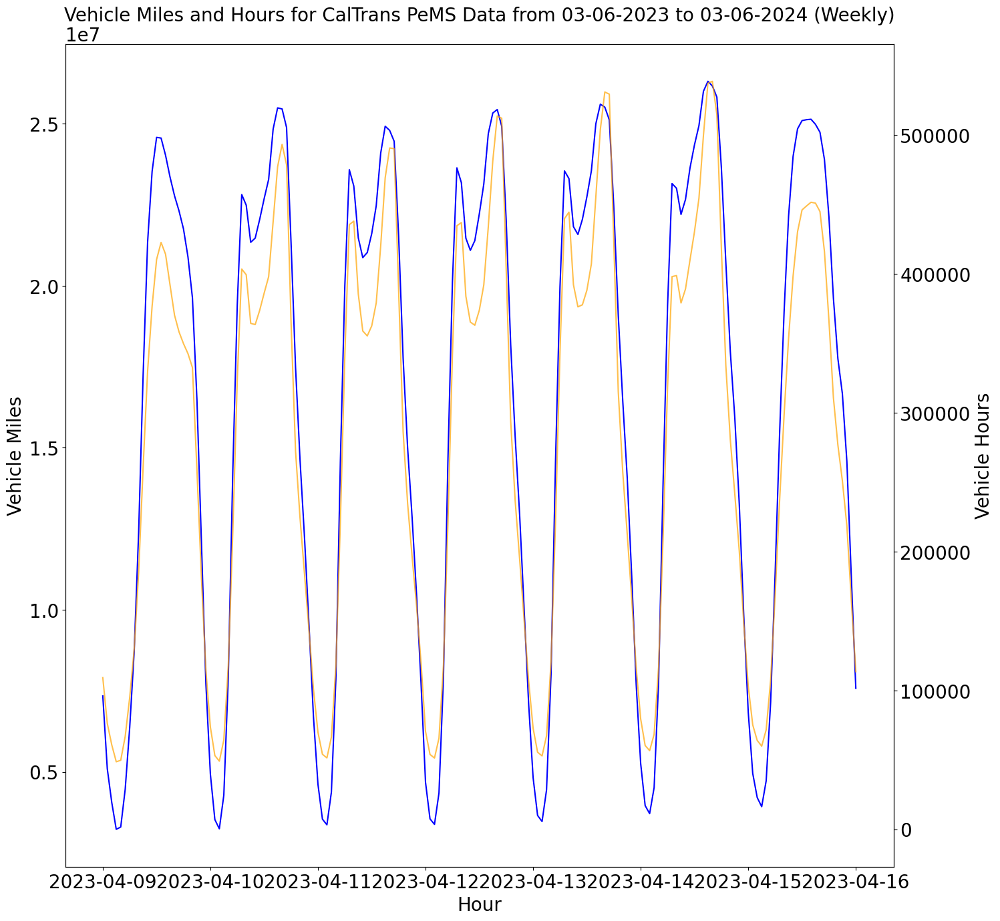

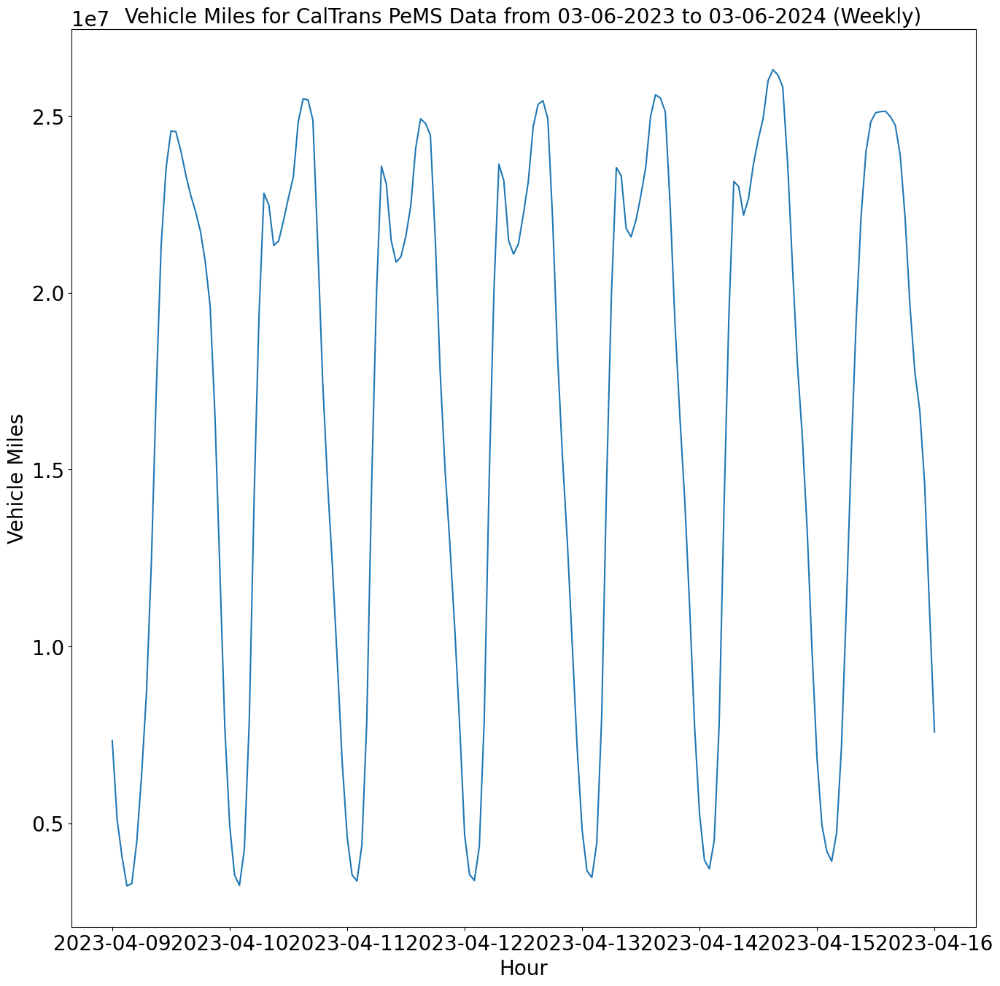

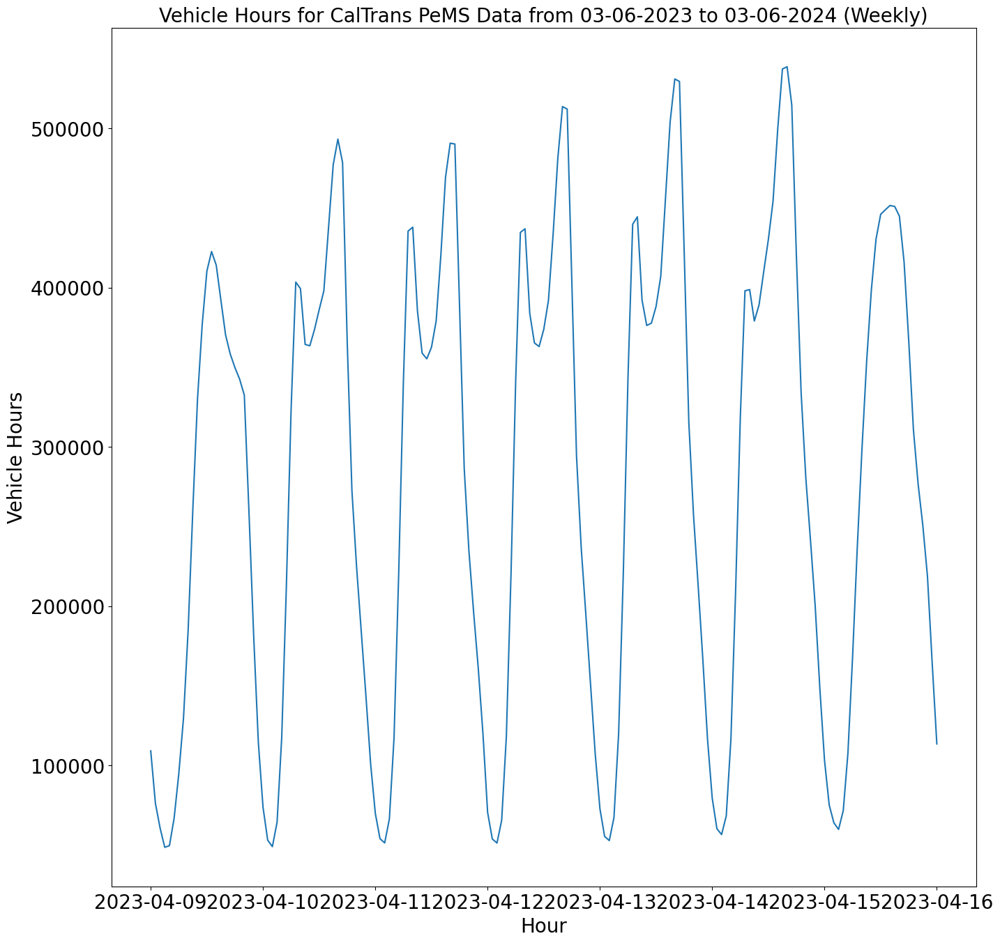

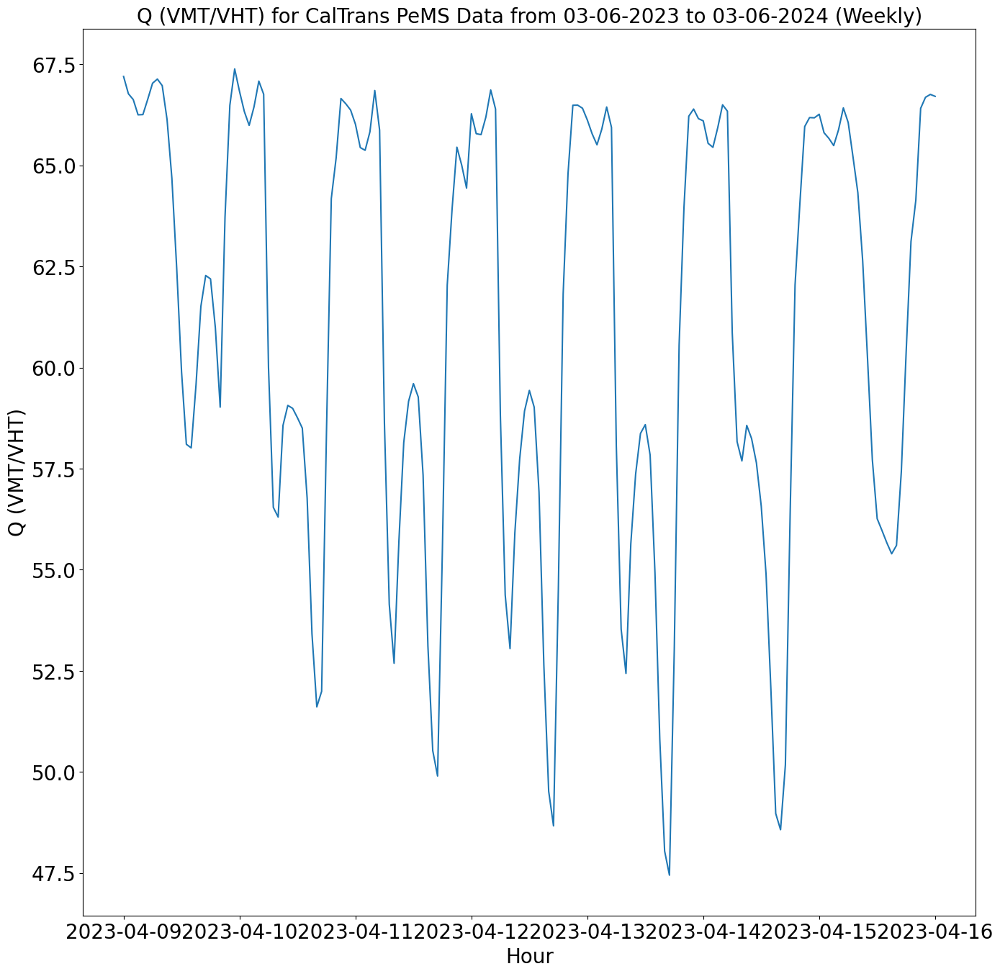

In [27]:
plot_veh_mi_hrs(weekly_df, 0, weekly_df.shape[0], "Weekly", title_name)
plot_veh_mi_hrs_Q(weekly_df['VMT (Veh-Miles)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Vehicle Miles')
plot_veh_mi_hrs_Q(weekly_df['VHT (Veh-Hours)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Vehicle Hours')
plot_veh_mi_hrs_Q(weekly_df['Q (VMT/VHT)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Q (VMT/VHT)')

### Monthly Plots (Seasonality)

In [28]:
monthly_df = df.query("Hour >= '2023-05-01' \
                       and Hour <= '2023-06-01'")

monthly_df

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-05-01 00:00:00,5026912.3,75439.4,66.635104,431709,52.5
2023-05-01 01:00:00,3701062.9,55985.2,66.107880,431704,52.5
2023-05-01 02:00:00,3414046.6,51859.2,65.832998,431698,52.5
2023-05-01 03:00:00,4413611.8,66772.5,66.099244,431704,52.4
2023-05-01 04:00:00,8122783.4,122095.1,66.528332,431719,52.4
...,...,...,...,...,...
2023-05-31 20:00:00,15473197.3,238845.5,64.783290,431647,48.7
2023-05-31 21:00:00,13272015.7,199268.5,66.603681,431741,48.7
2023-05-31 22:00:00,10321713.0,154610.6,66.759414,431748,48.5


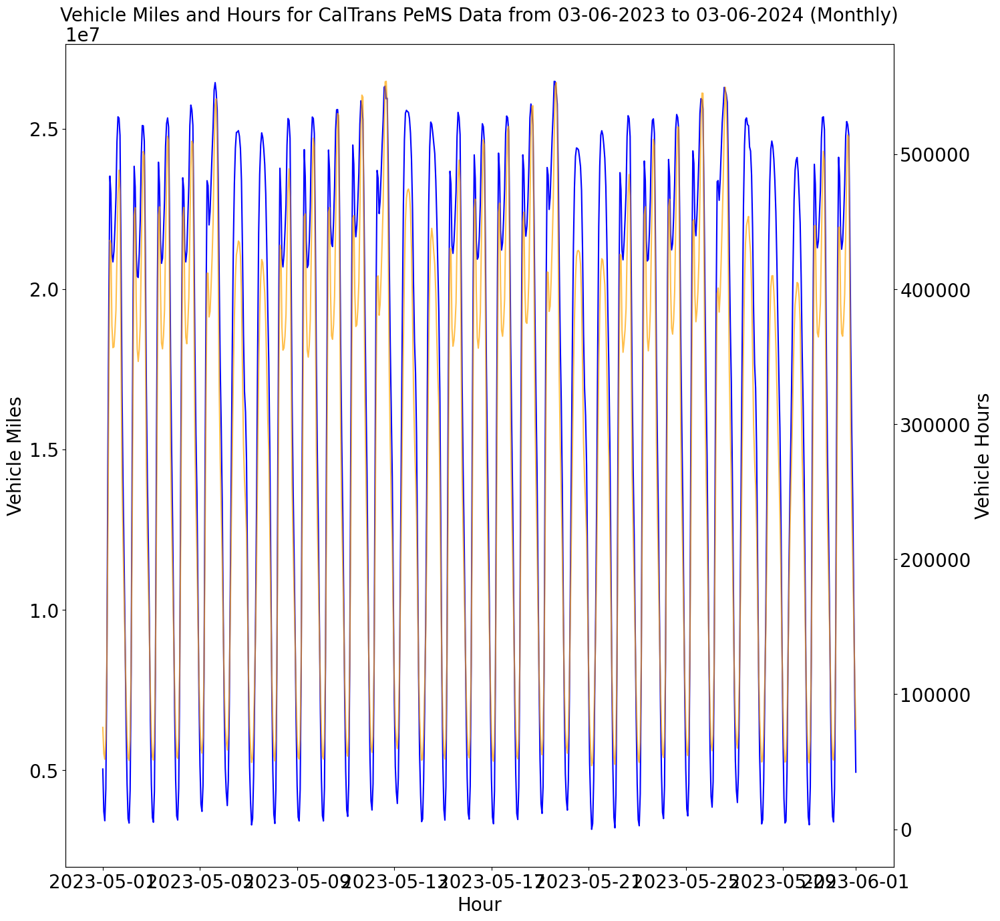

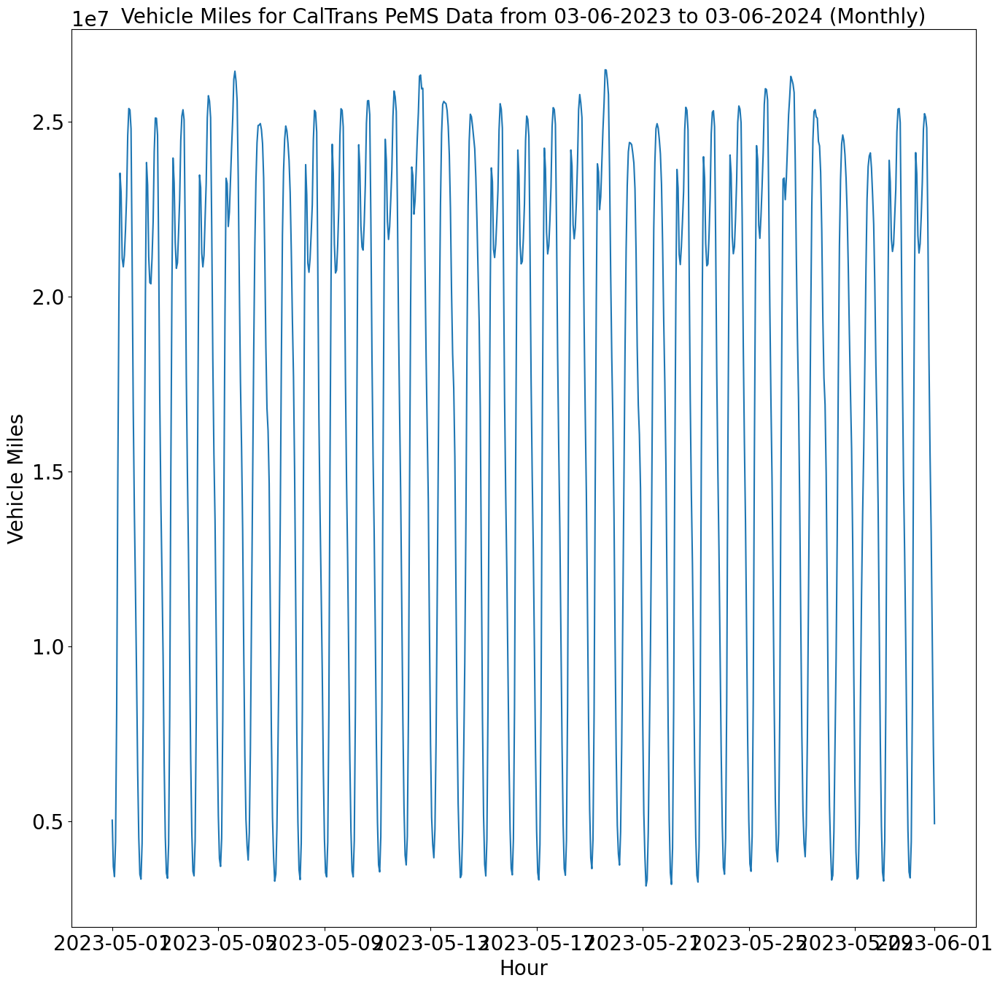

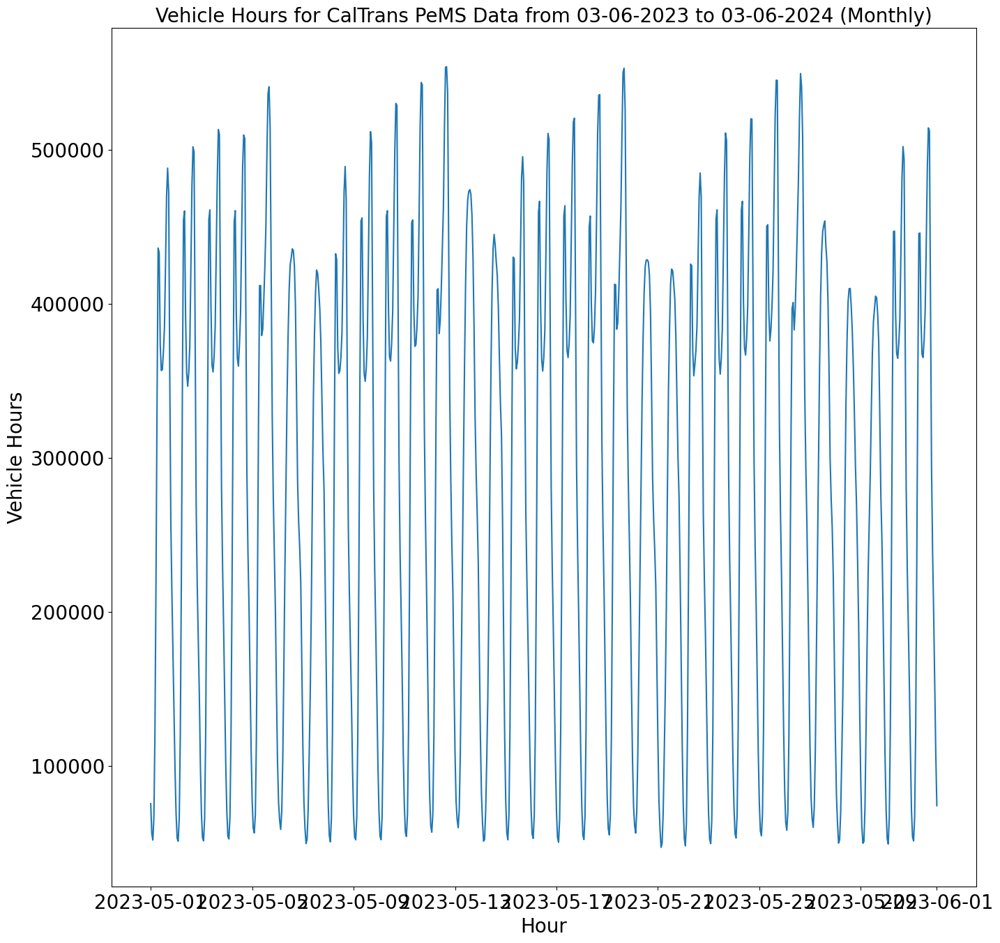

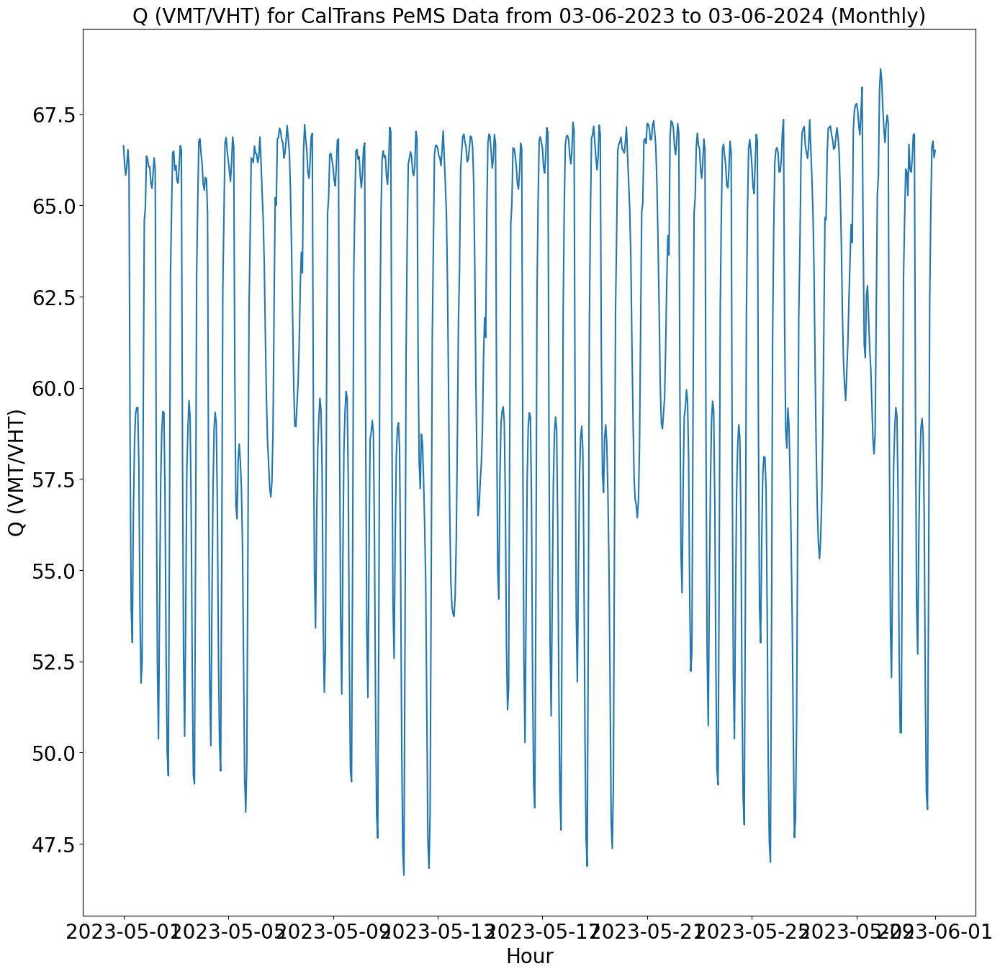

In [29]:
plot_veh_mi_hrs(monthly_df, 0, monthly_df.shape[0], "Monthly", title_name)
plot_veh_mi_hrs_Q(monthly_df['VMT (Veh-Miles)'], 0, monthly_df.shape[0],
                  "Monthly", title_name, 'Vehicle Miles')
plot_veh_mi_hrs_Q(monthly_df['VHT (Veh-Hours)'], 0, monthly_df.shape[0],
                  "Monthly", title_name, 'Vehicle Hours')
plot_veh_mi_hrs_Q(monthly_df['Q (VMT/VHT)'], 0, monthly_df.shape[0], "Monthly",
                  title_name, 'Q (VMT/VHT)')

### Combined Plots
Trend and Seaonality Plots are also plotted in combination.

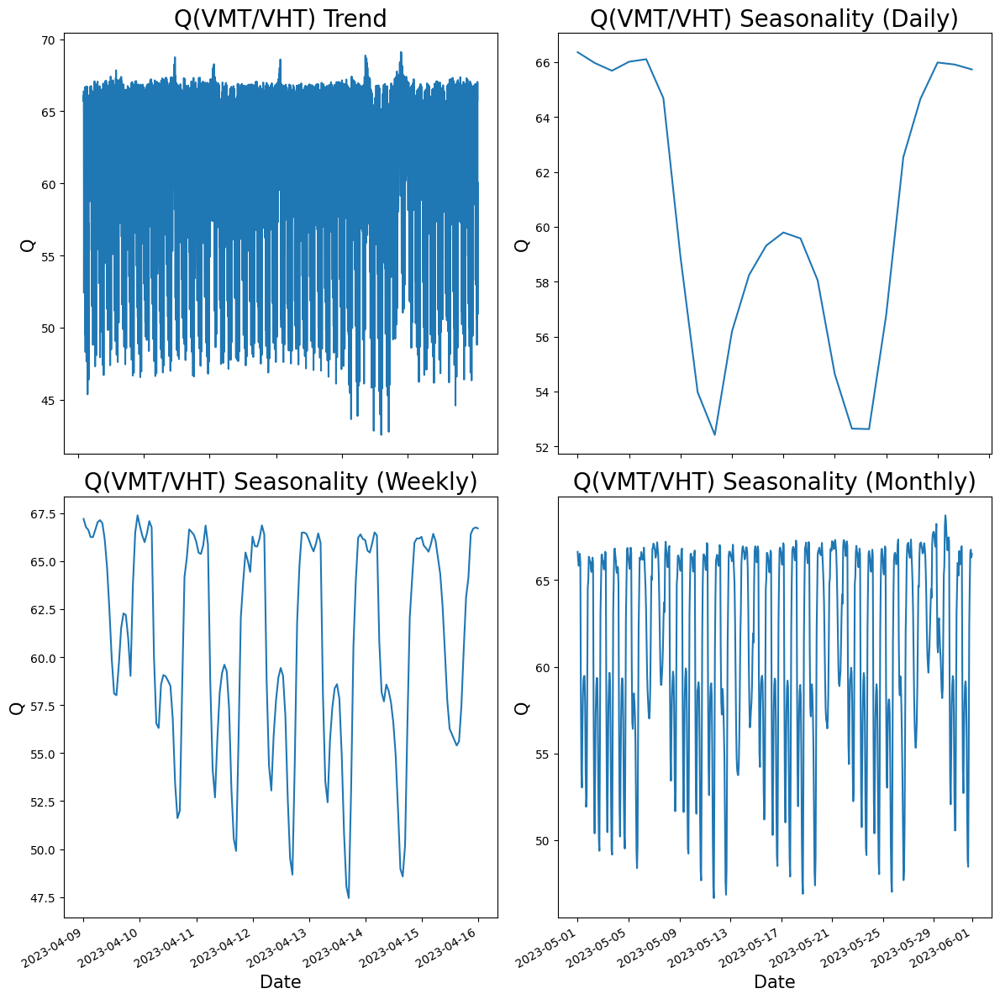

In [30]:
fig, axes = plt.subplots(2, 2, figsize=(12, 12)) # 5 rows, 1 column
axes[0, 0].plot(df.index, df['Q (VMT/VHT)'])
axes[0, 0].set_title('Q(VMT/VHT) Trend', fontsize = 20)
axes[0, 0].set_ylabel('Q', fontsize = 15)
axes[0, 0].set_xlabel('Date', fontsize = 15)
axes[0, 0].tick_params(axis='y', labelsize=10)   # Adjust y-axis tick label size
axes[0, 0].tick_params(axis='x', labelsize=10)  # Adjust x-axis tick label s
axes[0, 1].plot(df.index[:24], df['Q (VMT/VHT)'][:24])
axes[0, 1].set_title('Q(VMT/VHT) Seasonality (Daily)', fontsize = 20)
axes[0, 1].set_ylabel('Q', fontsize = 15)
axes[0, 1].set_xlabel('Date', fontsize = 15)
axes[0, 1].tick_params(axis='x', labelsize=10)  # Adjust x-axis tick label size
axes[0, 1].tick_params(axis='y', labelsize=10)   # Adjust y-axis tick label size
axes[0, 1].set_xlabel('Date', fontsize = 15)
#axes[0, 1].locator_params(axis='x', nbins=2)  # Reduce x-ticks for this subplot
axes[1, 0].plot(weekly_df.index, weekly_df['Q (VMT/VHT)'])
axes[1, 0].set_title('Q(VMT/VHT) Seasonality (Weekly)', fontsize = 20)
axes[1, 0].set_ylabel('Q', fontsize = 15)
axes[1, 0].tick_params(axis='y', labelsize=10)   # Adjust y-axis tick label size
axes[1, 0].tick_params(axis='x', labelsize=10)  # Adjust x-axis tick label size
axes[1, 0].set_xlabel('Date', fontsize = 15)
axes[1, 0].locator_params(axis='x', nbins=1)  # Reduce x-ticks for this subplot
axes[1, 1].plot(monthly_df.index, monthly_df['Q (VMT/VHT)'])
axes[1, 1].set_title('Q(VMT/VHT) Seasonality (Monthly)', fontsize = 20)
axes[1, 1].set_ylabel('Q', fontsize = 15)
axes[1, 1].set_xlabel('Date', fontsize = 15)
axes[1, 1].tick_params(axis='x', labelsize=10)  # Adjust x-axis tick label size
axes[1, 1].tick_params(axis='y', labelsize=10)   # Adjust y-axis tick label size
axes[1, 1].set_xlabel('Date', fontsize = 15)
axes[1, 1].locator_params(axis='x', nbins=1)  # Reduce x-ticks for this subplot
fig.autofmt_xdate()
fig.tight_layout() # Adjusts subplot parameters for a tight layout

# Normalization Process

Normalize data based on MinMaxScaler, StandardScaler, MaxAbsScaler or RobustScaler.

In [31]:
def get_scaler(scaler):
    scalers = {
        "minmax": MinMaxScaler,
        "standard": StandardScaler,
        "maxabs": MaxAbsScaler,
        "robust": RobustScaler,
    }
    return scalers.get(scaler.lower())()

def normalize_data(df):
    scaler_type = 'minmax'
    #scaler_type = input("Enter a scaler type (minmax,standard, maxabs, robust): ")
    if (scaler_type != 'minmax') and (scaler_type != 'standard') and (scaler_type != 'maxabs') and (scaler_type != 'robust'):
      runtime.unassign()

    scaler = get_scaler(scaler_type)
    normalized_data_vmt = scaler.fit_transform(df['VMT (Veh-Miles)'].
                                               values.reshape(-1,1))
    df['vmt_norm'] = normalized_data_vmt
    normalized_data_vht = scaler.fit_transform(df['VHT (Veh-Hours)'].
                                               values.reshape(-1,1))
    df['vht_norm'] = normalized_data_vht
    normalized_data_Q = scaler.fit_transform(df['Q (VMT/VHT)'].
                                               values.reshape(-1,1))
    df['Q_norm'] = normalized_data_Q
    return df, scaler

df_norm, scaler = normalize_data(df)
df_norm_mon, scaler = normalize_data(monthly_df)
df_norm_wk, scaler = normalize_data(weekly_df)
df_norm_day, scaler = normalize_data(monthly_df)


In [32]:
df_norm # Display normalized data.

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
Hour,,,,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342
...,...,...,...,...,...,...,...,...
2024-03-06 07:00:00,24603494.5,463279.8,53.107203,443975,54.1,0.901642,0.773489,0.397474
2024-03-06 08:00:00,23952196.6,470345.1,50.924729,443974,54.2,0.874690,0.786497,0.315210
2024-03-06 09:00:00,22128475.5,404745.4,54.672581,444146,53.0,0.799220,0.665724,0.456477


## Plot VMT, VHT, Q Normalized based on Trend and Seasonality.

Now after normalization we can observe that the data range on y-axis is 0.0 - 1.0. Same Trend and Seasonality Plots are shown for VMT, VHT, and Q.

### Yearly Plots (Trend)

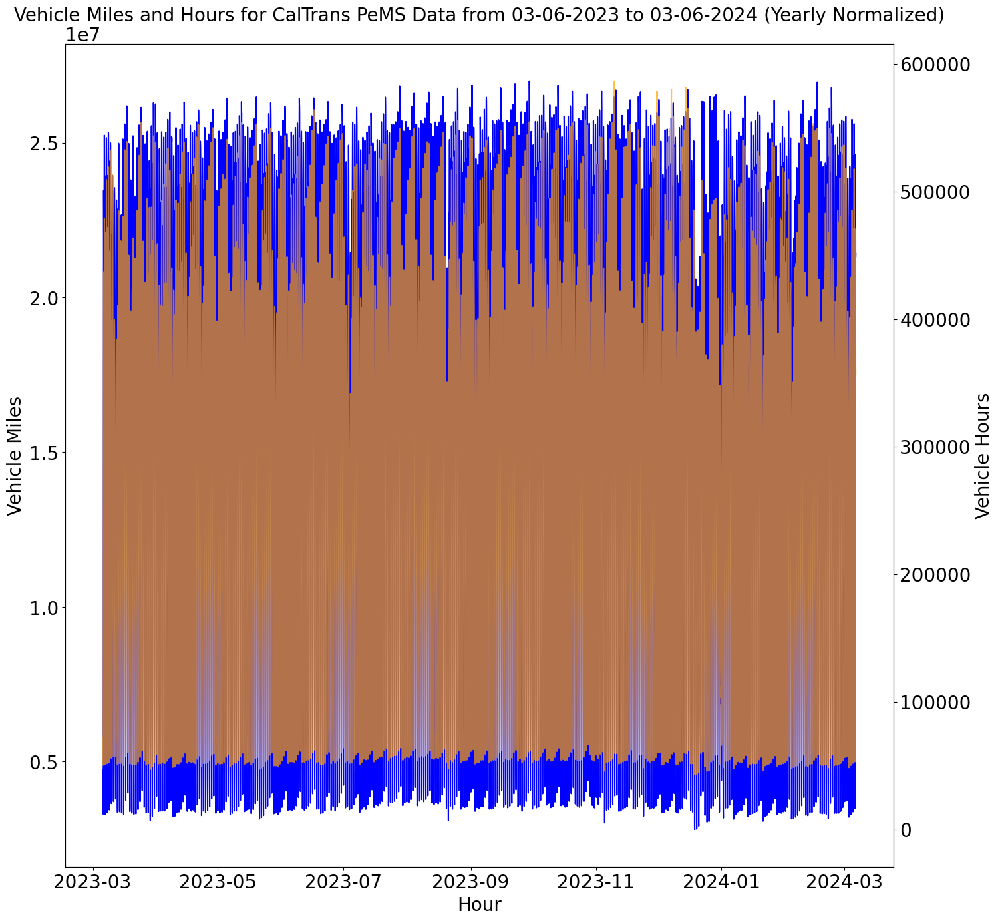

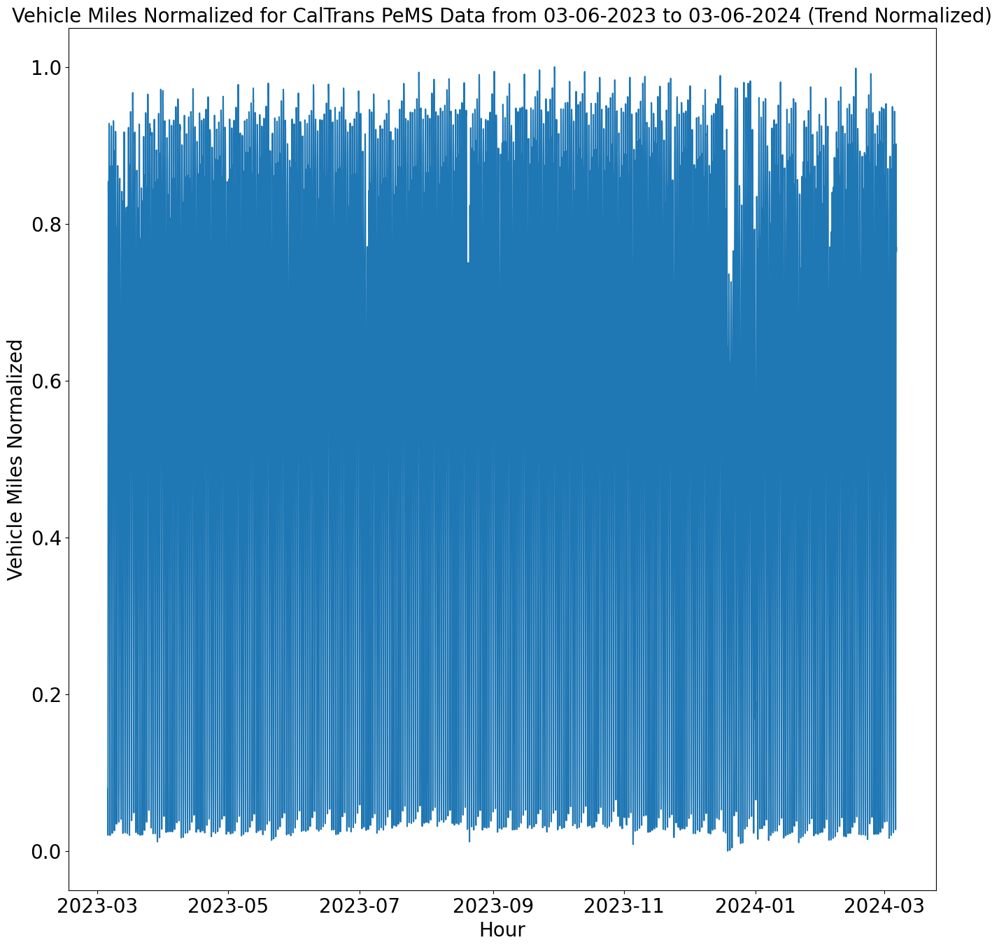

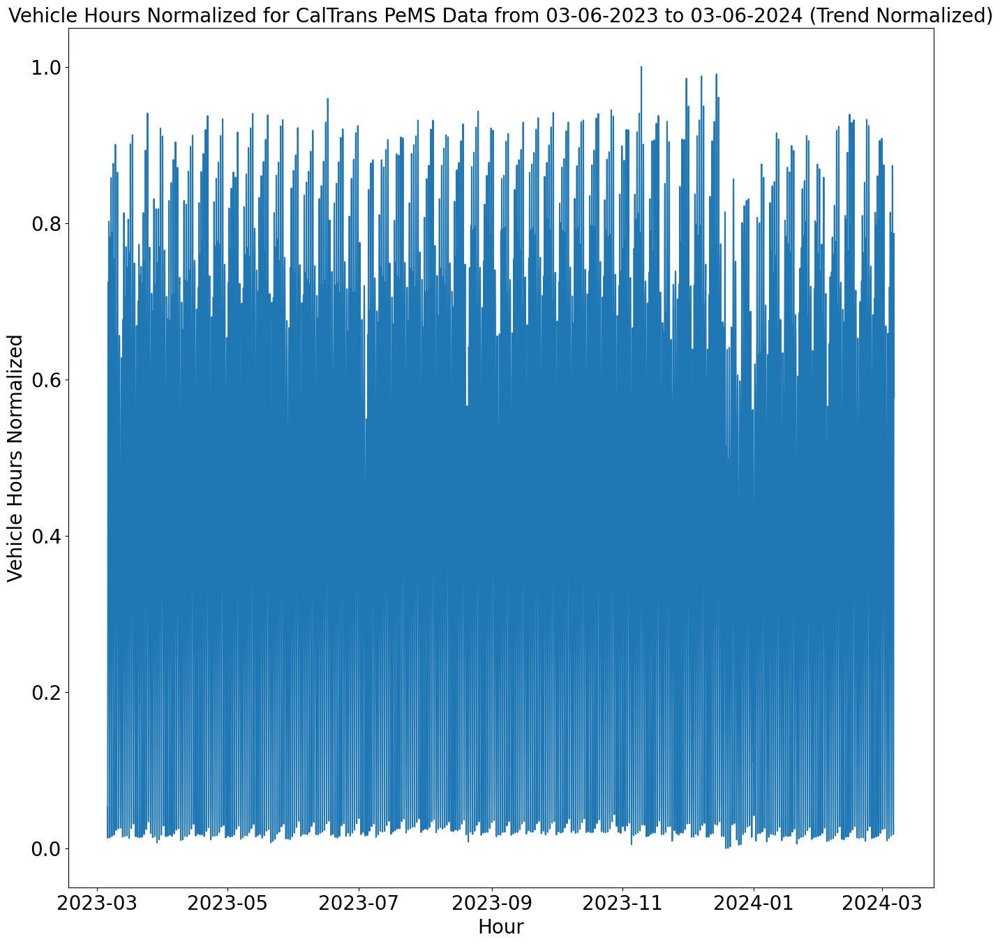

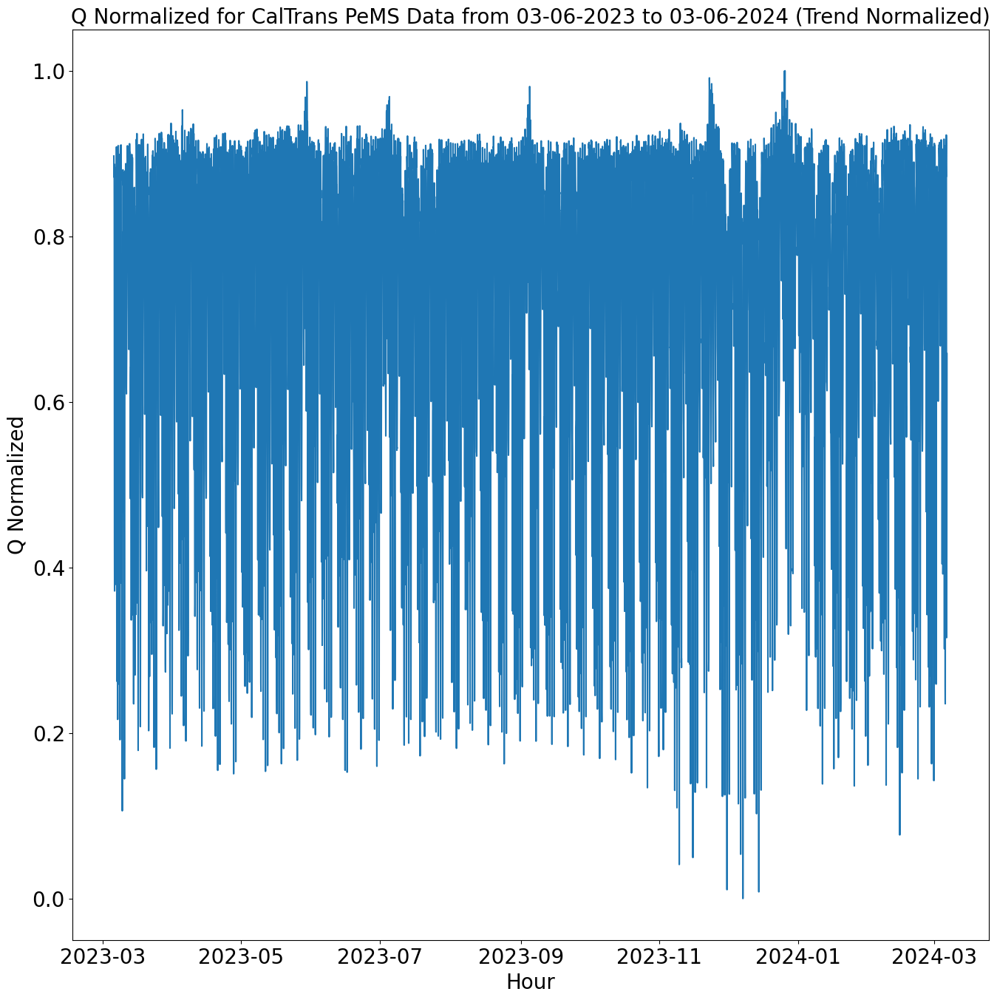

In [33]:
plot_veh_mi_hrs(df_norm, 0, df_norm.shape[0], 'Yearly Normalized', title_name)
plot_veh_mi_hrs_Q(df_norm['vmt_norm'], 0, df_norm.shape[0], 'Trend Normalized',
                  title_name, 'Vehicle Miles Normalized')
plot_veh_mi_hrs_Q(df_norm['vht_norm'], 0, df_norm.shape[0], 'Trend Normalized',
                  title_name, 'Vehicle Hours Normalized')
plot_veh_mi_hrs_Q(df_norm['Q_norm'], 0, df_norm.shape[0], 'Trend Normalized',
                  title_name, 'Q Normalized')

### Daily Plots (Seasonality)

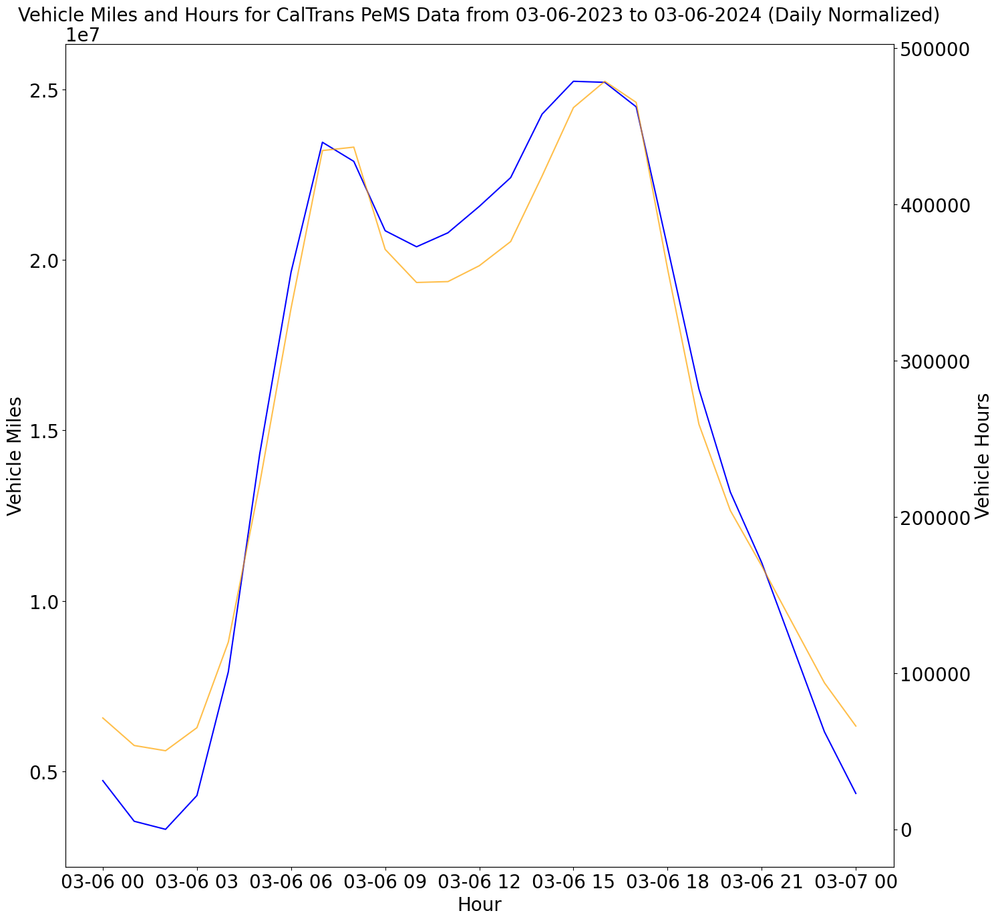

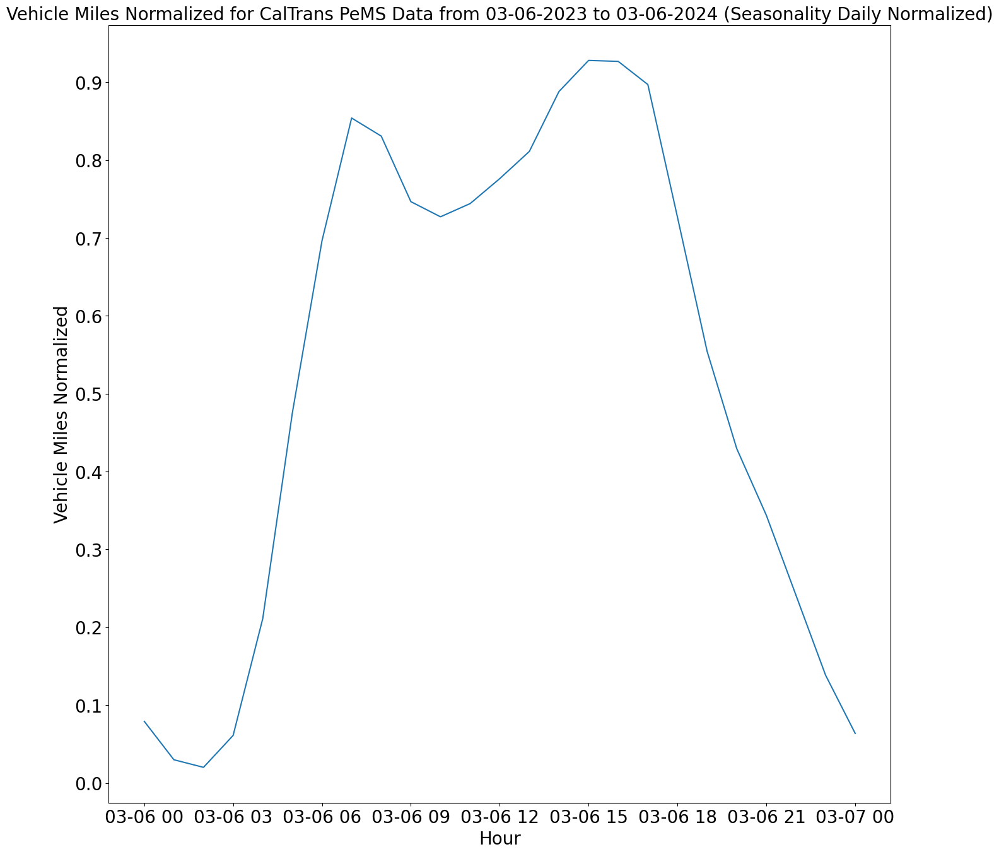

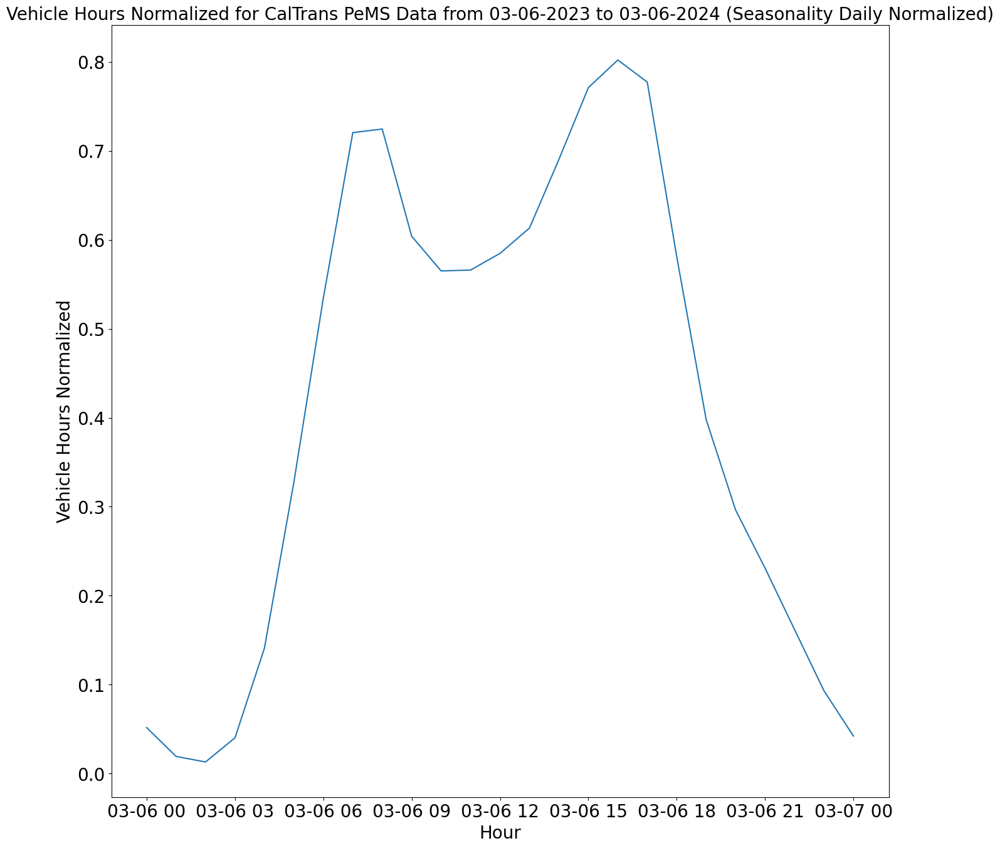

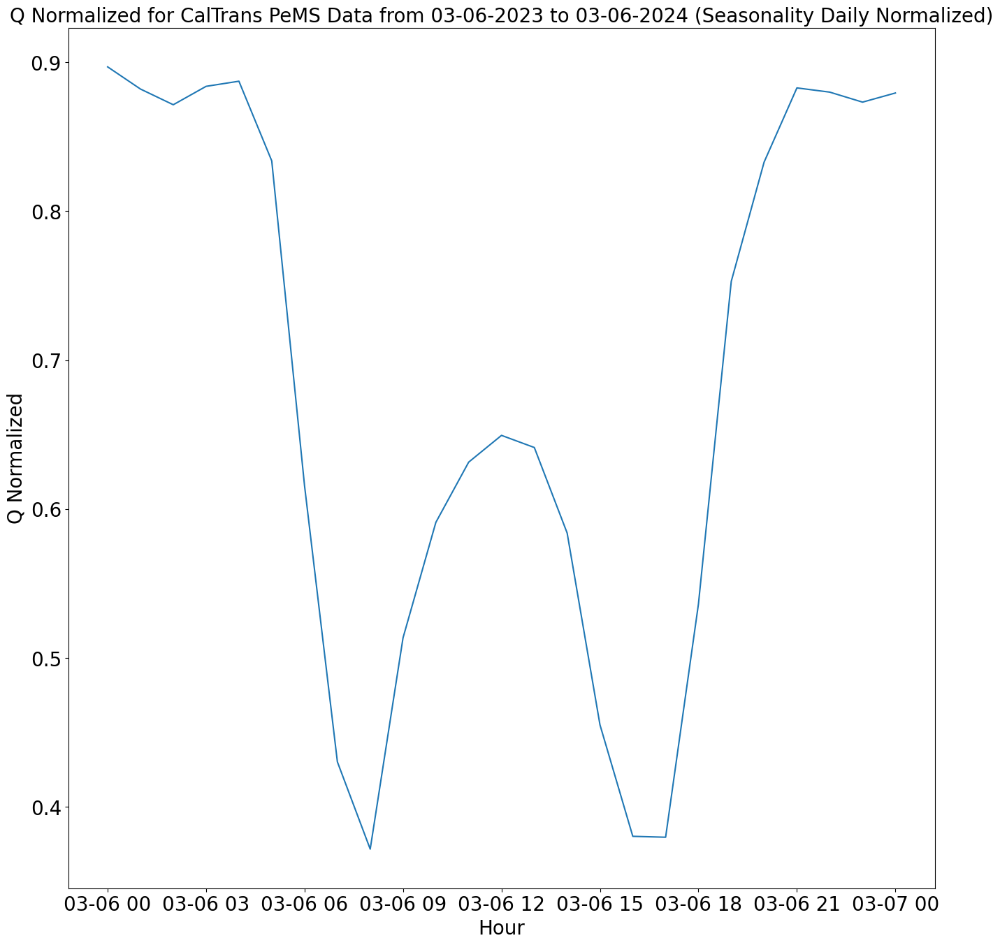

In [34]:
plot_veh_mi_hrs(df_norm, 0, 25, 'Daily Normalized', title_name)
plot_veh_mi_hrs_Q(df_norm['vmt_norm'], 0, 25, 'Seasonality Daily Normalized',
                  title_name, 'Vehicle Miles Normalized')
plot_veh_mi_hrs_Q(df_norm['vht_norm'], 0, 25, 'Seasonality Daily Normalized',
                  title_name, 'Vehicle Hours Normalized')
plot_veh_mi_hrs_Q(df_norm['Q_norm'], 0, 25, 'Seasonality Daily Normalized',
                  title_name, 'Q Normalized')

### Weekly Plots (Seasonality)

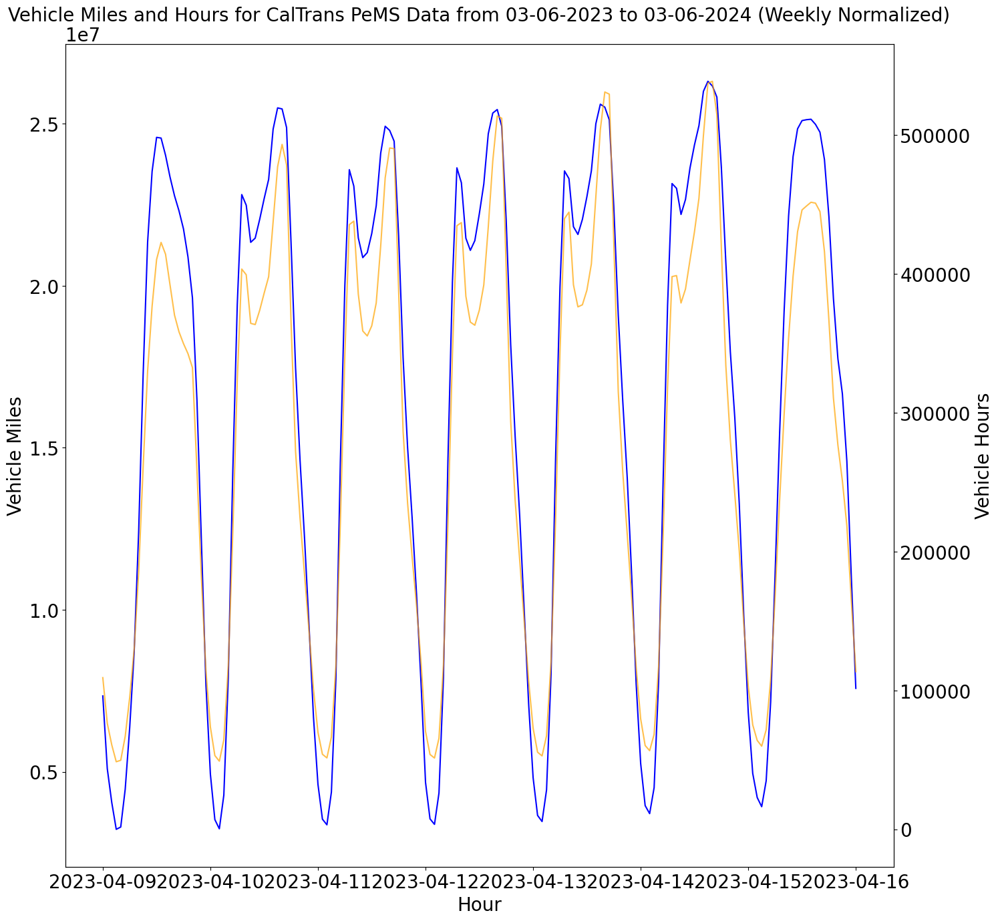

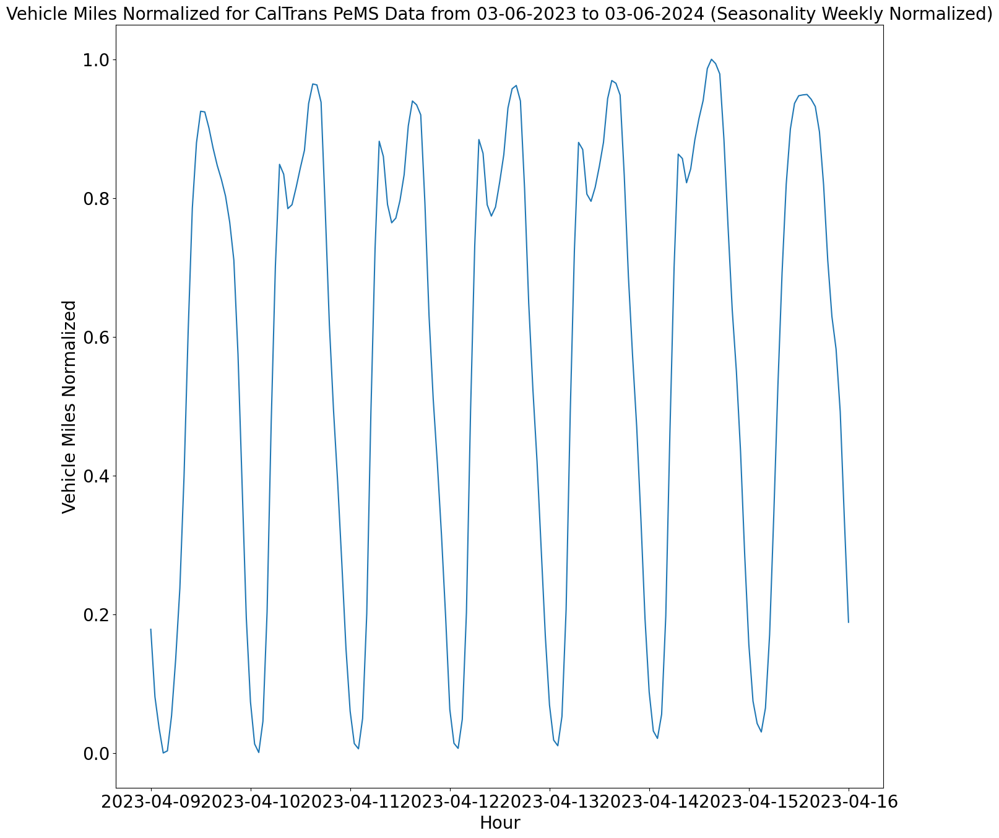

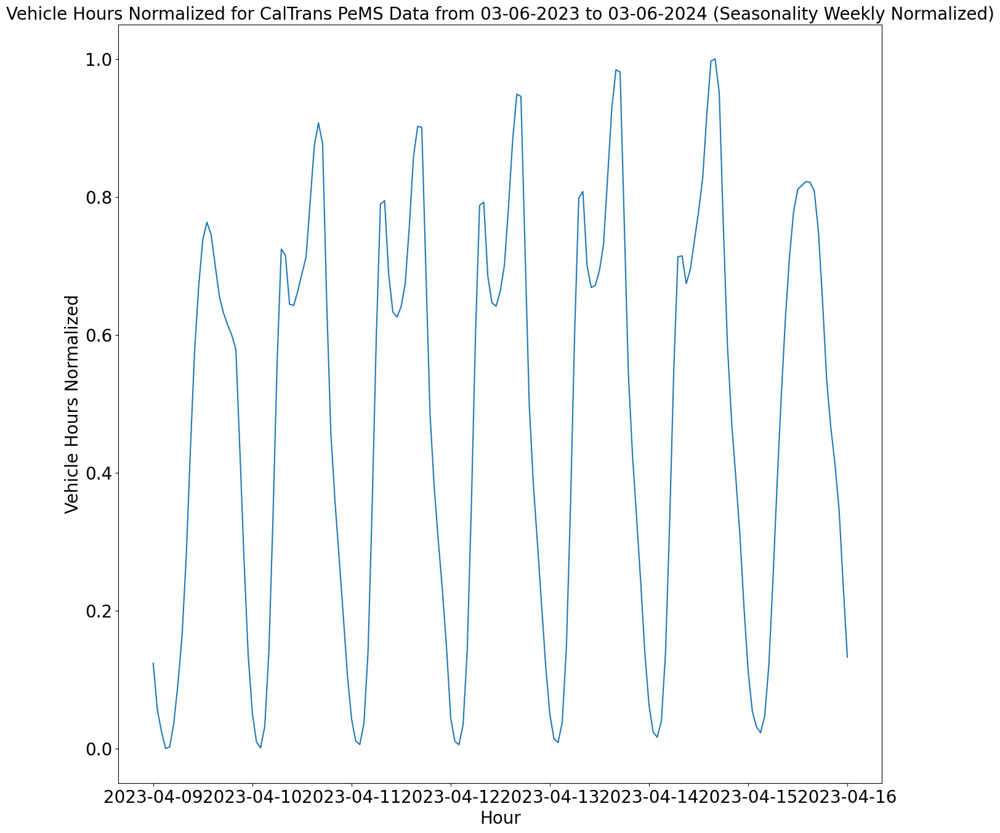

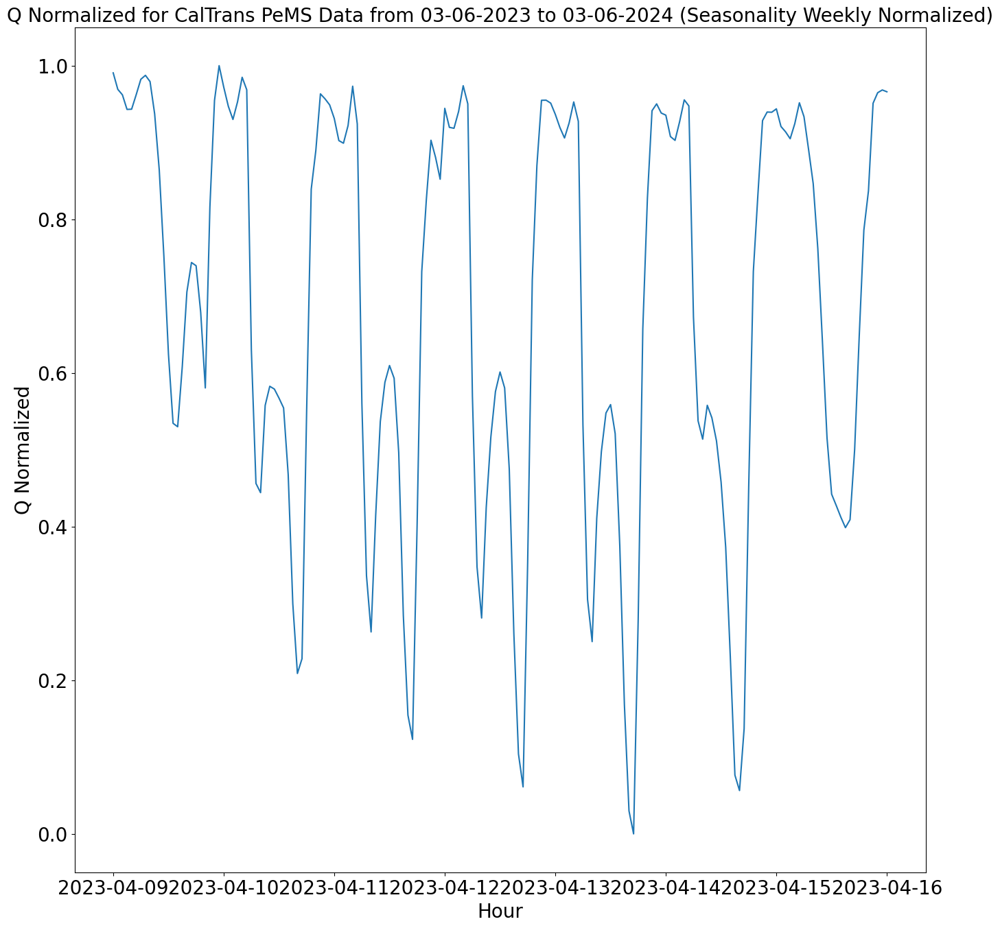

In [35]:
plot_veh_mi_hrs(df_norm_wk, 0, df_norm_wk.shape[0], 'Weekly Normalized',
                title_name)
plot_veh_mi_hrs_Q(df_norm_wk['vmt_norm'], 0, df_norm_wk.shape[0],
                  'Seasonality Weekly Normalized', title_name,
                  'Vehicle Miles Normalized')
plot_veh_mi_hrs_Q(df_norm_wk['vht_norm'], 0, df_norm_wk.shape[0],
                  'Seasonality Weekly Normalized', title_name,
                  'Vehicle Hours Normalized')
plot_veh_mi_hrs_Q(df_norm_wk['Q_norm'], 0, df_norm_wk.shape[0],
                  'Seasonality Weekly Normalized', title_name, 'Q Normalized')

### Monthly Plots (Seasonality)

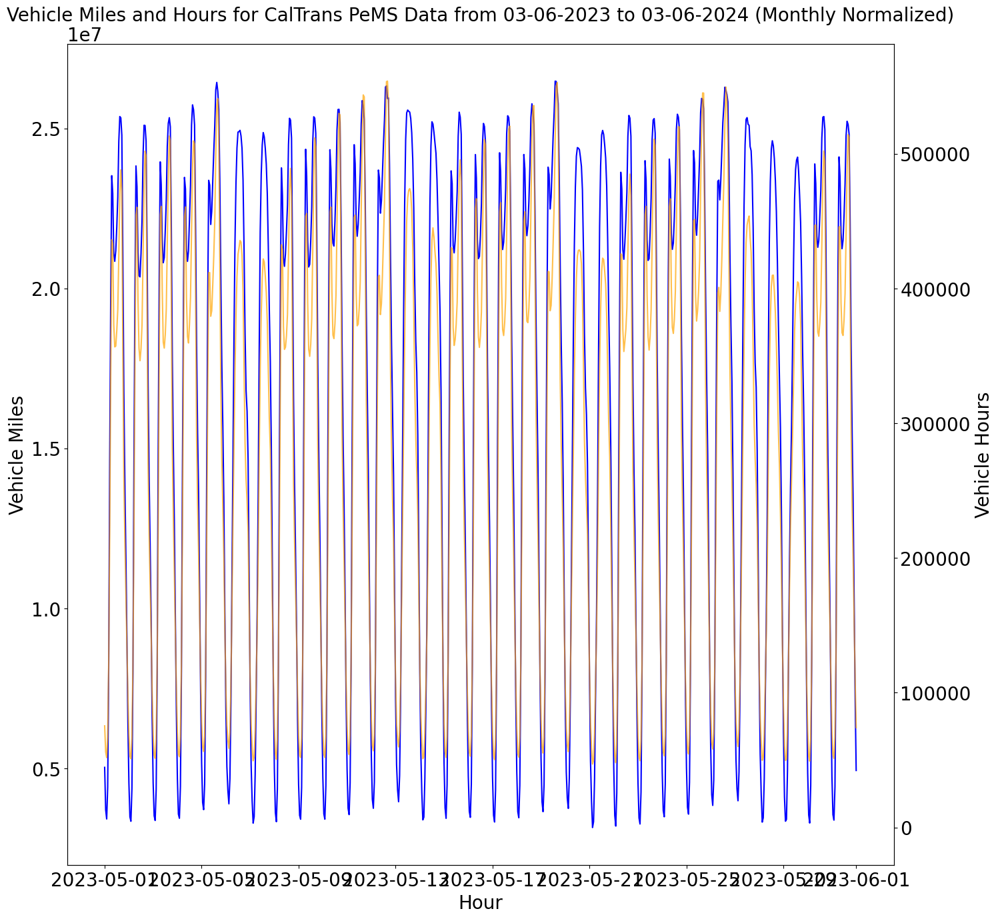

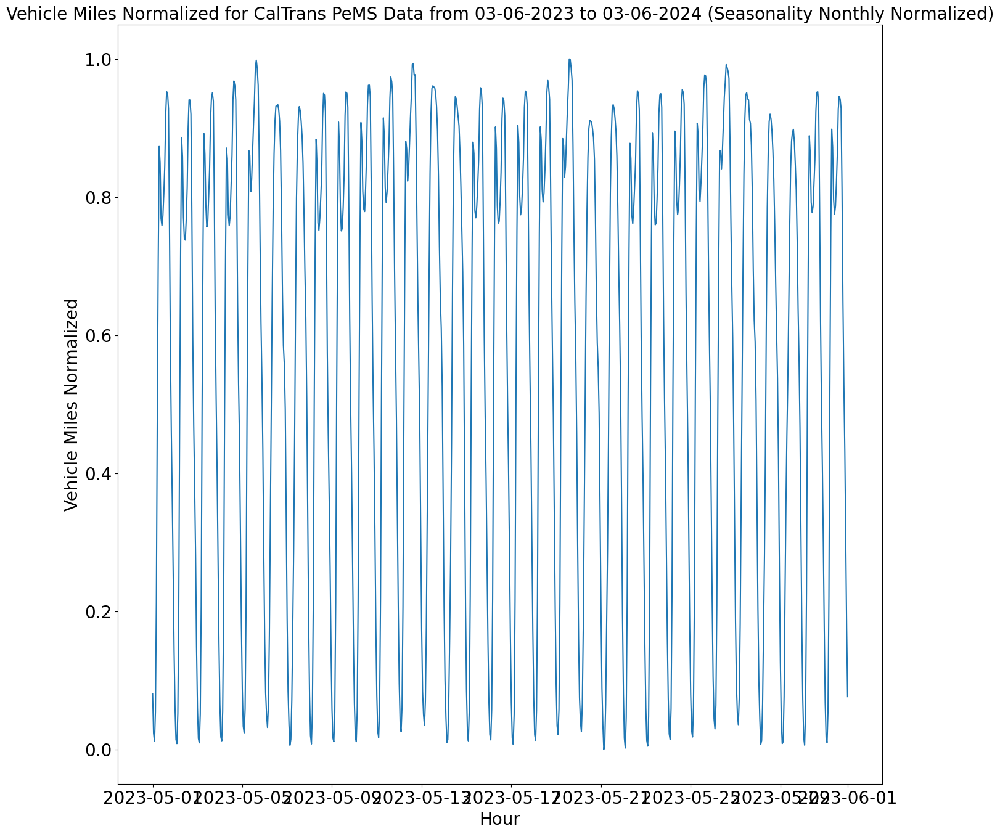

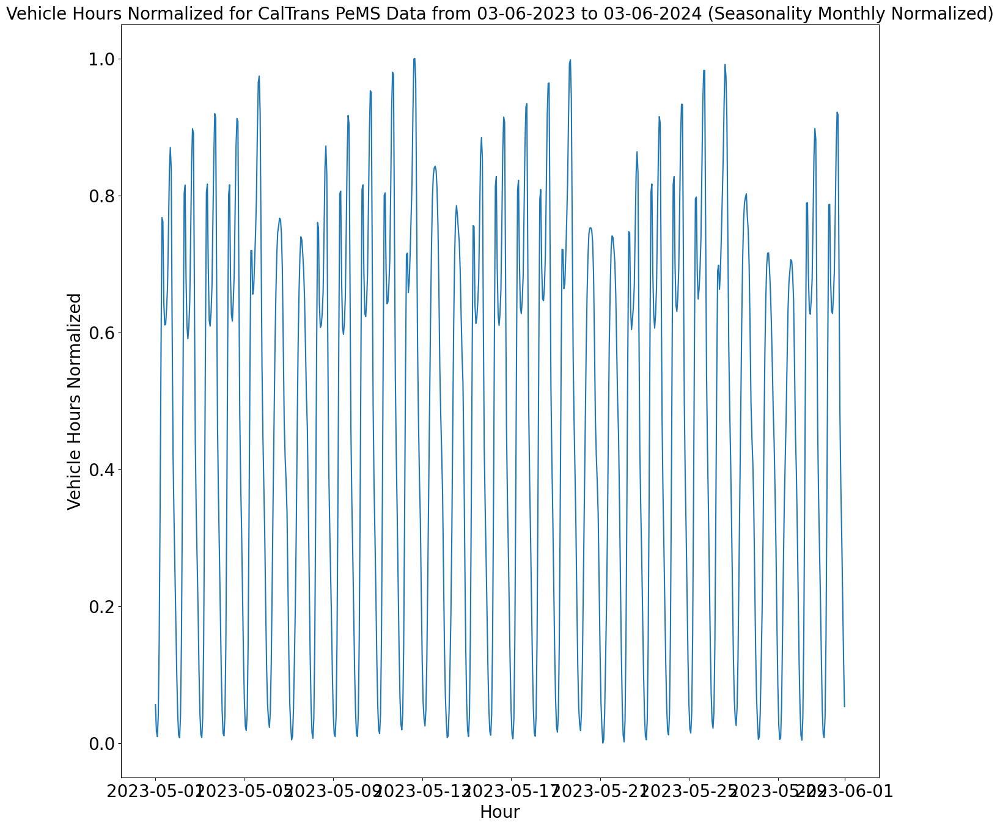

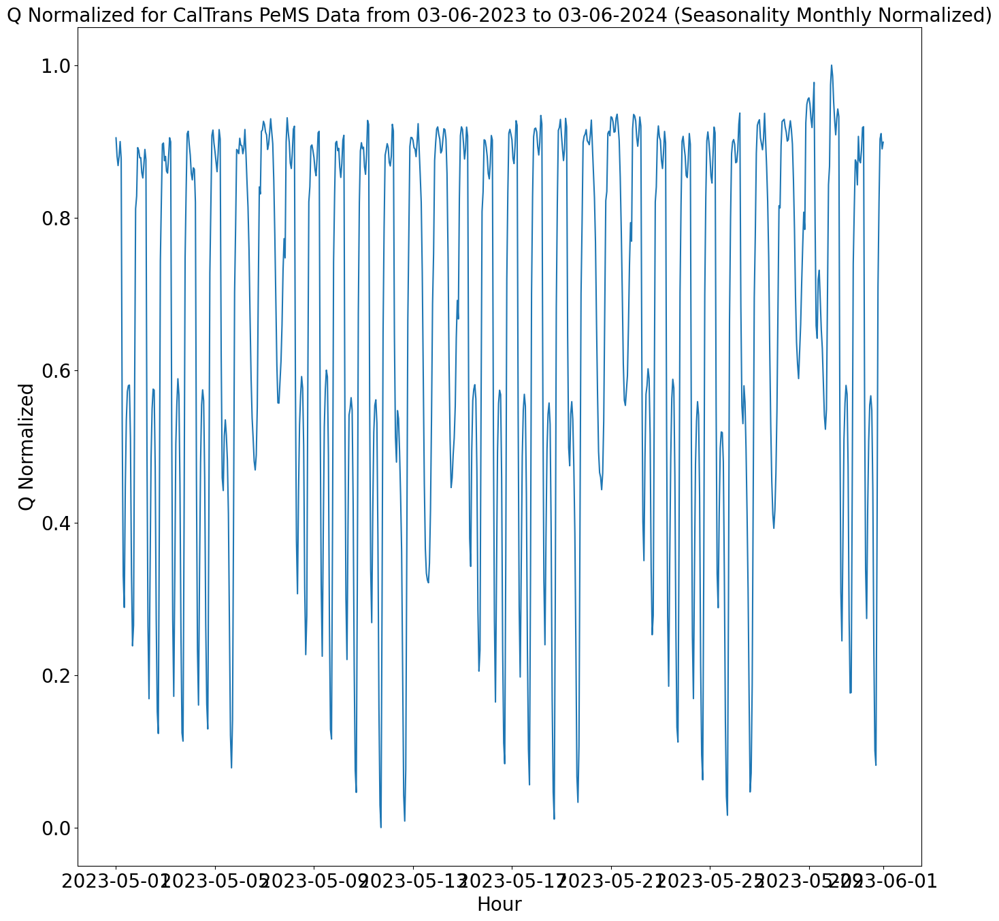

In [36]:
plot_veh_mi_hrs(df_norm_mon, 0, df_norm_mon.shape[0], 'Monthly Normalized',
                title_name)
plot_veh_mi_hrs_Q(df_norm_mon['vmt_norm'], 0, df_norm_mon.shape[0],
                  'Seasonality Nonthly Normalized', title_name,
                  'Vehicle Miles Normalized')
plot_veh_mi_hrs_Q(df_norm_mon['vht_norm'], 0, df_norm_mon.shape[0],
                  'Seasonality Monthly Normalized', title_name,
                  'Vehicle Hours Normalized')
plot_veh_mi_hrs_Q(df_norm_mon['Q_norm'], 0, df_norm_mon.shape[0],
                  'Seasonality Monthly Normalized', title_name,
                  'Q Normalized')

# Let's observe train and test data on the graph

## Split into Train/Test Data.

In [37]:
test_size = 0.2 # Set Split rate to 4:1 (80 % Training 20 % Test).
split_pos = int(df.shape[0]*(1 - test_size))
df = df.reset_index()
df

,Hour,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
0,2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
1,2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2,2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
3,2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
4,2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342
...,...,...,...,...,...,...,...,...,...
8790,2024-03-06 07:00:00,24603494.5,463279.8,53.107203,443975,54.1,0.901642,0.773489,0.397474
8791,2024-03-06 08:00:00,23952196.6,470345.1,50.924729,443974,54.2,0.874690,0.786497,0.315210
8792,2024-03-06 09:00:00,22128475.5,404745.4,54.672581,444146,53.0,0.799220,0.665724,0.456477
8793,2024-03-06 10:00:00,21287942.9,362457.5,58.732246,443929,49.3,0.764437,0.587870,0.609496


In [38]:
# 2019-02-06 will be the date seperation. Dates past this will be the test set.
split_date = str(df.Hour[split_pos])
#split_date = split_date[:10]
#DOM_train = df_norm.loc[df_norm.index <= split_date].copy()
DOM_train = df.loc[df_norm.index <= split_date].copy()
#DOM_test = df_norm.loc[df_norm.index > split_date].copy()
DOM_test = df.loc[df_norm.index > split_date].copy()
split_date

'2023-12-24 05:00:00'

## Plot Train/Test Split Graphs.

For VMT, VHT, and Q.

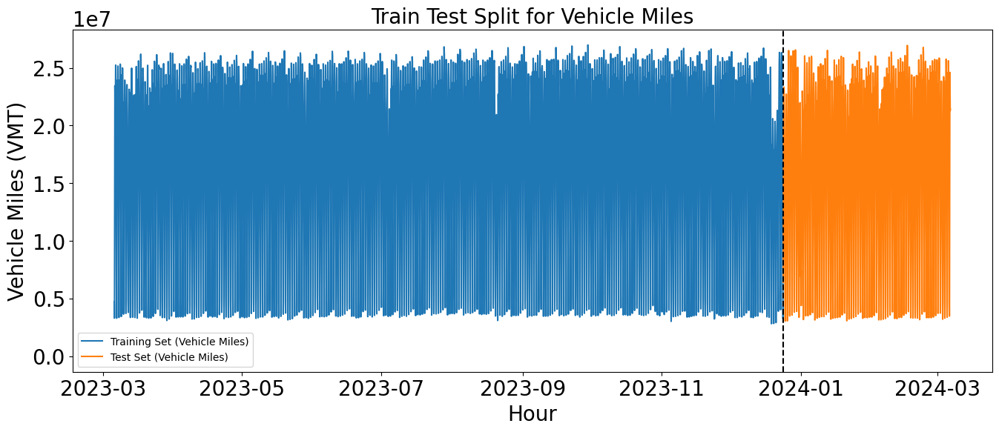

In [39]:
# Vehicle Miles Travelled (VMT)
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['VMT (Veh-Miles)'],
         label='Training Set (Vehicle Miles)')
plt.plot(DOM_test['Hour'], DOM_test['VMT (Veh-Miles)'],
         label='Testing Set (Vehicle Miles)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Vehicle Miles)', 'Test Set (Vehicle Miles)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour", fontsize = 20)
plt.ylabel("Vehicle Miles (VMT)", fontsize = 20)
plt.title("Train Test Split for Vehicle Miles", fontsize = 20)
plt.show()

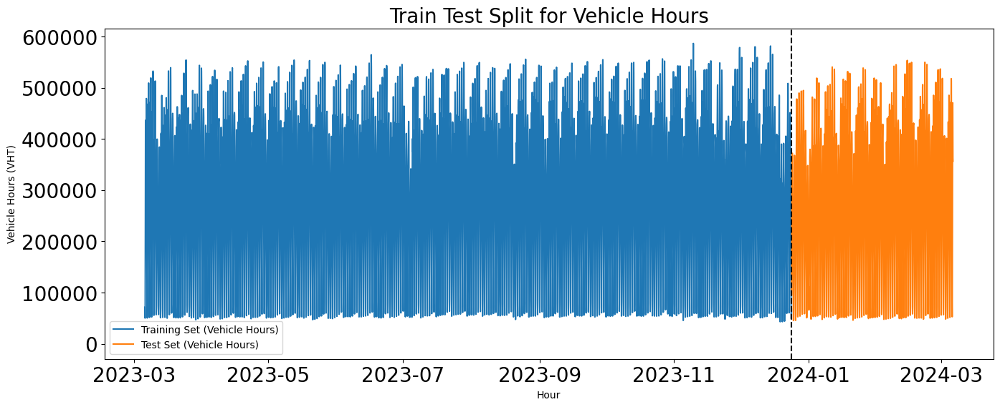

In [40]:
# Vehicle Hours Travelled (VHT)
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['VHT (Veh-Hours)'],
         label='Training Set (Vehicle Hours)')
plt.plot(DOM_test['Hour'], DOM_test['VHT (Veh-Hours)'],
         label='Testing Set (Vehicle Hours)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Vehicle Hours)', 'Test Set (Vehicle Hours)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour")
plt.ylabel("Vehicle Hours (VHT)")
plt.title("Train Test Split for Vehicle Hours", fontsize = 20)
plt.show()

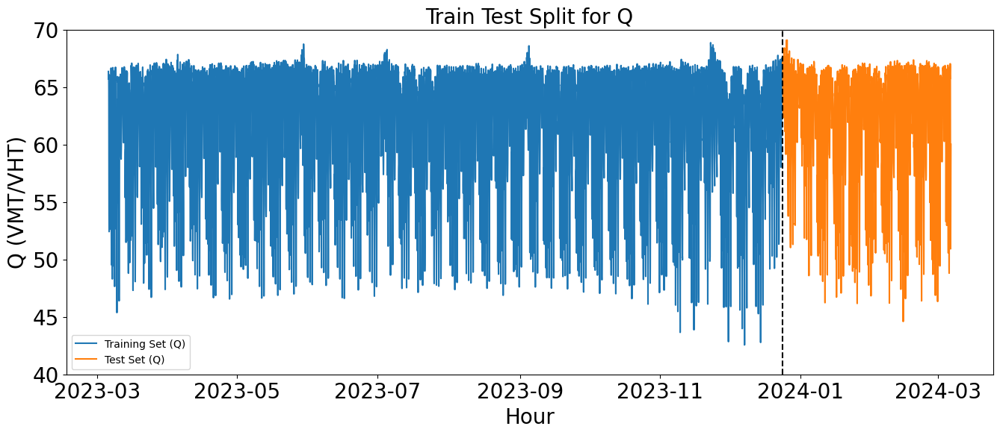

In [41]:
# Q is the sum of VMT divided by the sum of VHT or space mean
# speeds/harmonic mean of speeds on the freeway. It's also the efficiency
# measurement.
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['Q (VMT/VHT)'],
         label='Training Set (Vehicle Hours)')
plt.plot(DOM_test['Hour'], DOM_test['Q (VMT/VHT)'],
         label='Testing Set (Vehicle Hours)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Q)', 'Test Set (Q)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour", fontsize = 20)
plt.ylabel("Q (VMT/VHT)", fontsize = 20)
plt.ylim([40, 70])
plt.title("Train Test Split for Q", fontsize = 20)
plt.show()

In [42]:
# Datetime column is indexed after transformation
df.set_index('Hour', inplace=True)
df.head()

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
Hour,,,,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342


# Prepare Data for Training the Models.

* Data is set as training and test data set in a model appropriate way.

In [43]:
def load_data(data, seq_len):
    X_train = []
    y_train = []

    for i in range(seq_len, len(data)):
        X_train.append(data.iloc[i-seq_len : i, 0])
        y_train.append(data.iloc[i, 0])

    # last days are going to be used in test
    X_test = X_train[split_pos:]
    y_test = y_train[split_pos:]

    # first  days are going to be used in training
    X_train = X_train[:split_pos]
    y_train = y_train[:split_pos]

    # convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    X_test = np.array(X_test)
    y_test = np.array(y_test)

    # reshape data to input into RNN, LSTM, and GRU models
    X_train = np.reshape(X_train, (split_pos, seq_len, 1))
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))

    return [X_train, y_train, X_test, y_test]

* **The seq_len** parameter determines how far back the model will look at historical data, helping the model to capture time dependencies in a memory-aware way.
* We should note that if "seq_len" is too large, the model can become complex and prone to overlearning.

In [44]:
# Delete columns to create individual VHT, VMT, and Q dataframes.
df_vht = df_norm.copy()
df_vht = df_vht.drop(columns = ['VMT (Veh-Miles)', 'VHT (Veh-Hours)',
                                'Q (VMT/VHT)', '# Lane Points', '% Observed',
                                'vmt_norm', 'Q_norm'])
#df_vht = df.copy()
#df_vht = df_vht.drop(columns = ['VMT (Veh-Miles)', '# Lane Points',
#                                '% Observed', 'vmt_norm', 'vht_norm'])

df_vmt = df_norm.copy()
df_vmt = df_vmt.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                                'Q (VMT/VHT)', '# Lane Points', '% Observed',
                                'vht_norm', 'Q_norm'])
#df_vmt = df.copy()
#df_vmt = df_vmt.drop(columns = ['VHT (Veh-Hours)','# Lane Points',
#                                '% Observed', 'vmt_norm', 'vht_norm'])

df_Q = df_norm.copy()
df_Q = df_Q.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                            'Q (VMT/VHT)', '# Lane Points', '% Observed',
                            'vmt_norm', 'vht_norm'])

#df_Q = df_norm.copy()
#df_Q = df_Q.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
#                            '# Lane Points', '% Observed', 'vmt_norm',
#                            'vht_norm', 'Q_norm'])

In [45]:
# Also, normalized individual dataframes for VHT, VMT, and Q can be created.
df_norm2 = df_norm.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                                   '# Lane Points', '% Observed',])
df_norm2

,Q (VMT/VHT),vmt_norm,vht_norm,Q_norm
Hour,,,,
2023-03-06 00:00:00,66.359379,0.079266,0.051819,0.896983
2023-03-06 01:00:00,65.964212,0.029970,0.019358,0.882088
2023-03-06 02:00:00,65.684314,0.020192,0.013156,0.871538
2023-03-06 03:00:00,66.012154,0.061179,0.040319,0.883895
2023-03-06 04:00:00,66.103598,0.211209,0.141126,0.887342
...,...,...,...,...
2024-03-06 07:00:00,53.107203,0.901642,0.773489,0.397474
2024-03-06 08:00:00,50.924729,0.874690,0.786497,0.315210
2024-03-06 09:00:00,54.672581,0.799220,0.665724,0.456477


In [46]:
df_vht

,vht_norm
Hour,
2023-03-06 00:00:00,0.051819
2023-03-06 01:00:00,0.019358
2023-03-06 02:00:00,0.013156
2023-03-06 03:00:00,0.040319
2023-03-06 04:00:00,0.141126
...,...
2024-03-06 07:00:00,0.773489
2024-03-06 08:00:00,0.786497
2024-03-06 09:00:00,0.665724


In [47]:
df_vmt

,vmt_norm
Hour,
2023-03-06 00:00:00,0.079266
2023-03-06 01:00:00,0.029970
2023-03-06 02:00:00,0.020192
2023-03-06 03:00:00,0.061179
2023-03-06 04:00:00,0.211209
...,...
2024-03-06 07:00:00,0.901642
2024-03-06 08:00:00,0.874690
2024-03-06 09:00:00,0.799220


In [48]:
df_Q

,Q_norm
Hour,
2023-03-06 00:00:00,0.896983
2023-03-06 01:00:00,0.882088
2023-03-06 02:00:00,0.871538
2023-03-06 03:00:00,0.883895
2023-03-06 04:00:00,0.887342
...,...
2024-03-06 07:00:00,0.397474
2024-03-06 08:00:00,0.315210
2024-03-06 09:00:00,0.456477


In [49]:
# Enter a number based on the instructions provided below whether to use the
# df_vht, df_vmt, or df_Q dataframes. The number selected will utilize that
# particular dataframe.
a = int(input("Enter a number (Odd Number for Vehicle Hours,\
Even Number for Vehicle Miles\Odd Number divisible by 3 for Q (Space Mean/\
Harmonic Speed)): "))

feature = ""
selected_df = ""
feature_norm = ""
feature_field = ""

if a % 2 == 0:
    feature = 'Vehicle Miles'
    selected_df = df_vmt
    feature_norm = 'vmt_norm'
    feature_field = 'VMT (Veh-Miles)'

elif a % 3 == 0:
    feature = 'Space Mean/Harmonic Speed'
    selected_df = df_Q
    feature_norm = 'Q_norm'
    feature_field = 'Q (VMT/VHT)'

else:
    feature = 'Vehicle Hours'
    selected_df = df_vht
    feature_norm = 'vht_norm'
    feature_field = 'VHT (Veh-Hours)'

print("You've chosen: {0}/{1}/{2}".format(feature, feature_norm, feature_field))

Enter a number (Odd Number for Vehicle Hours,Even Number for Vehicle Miles\Odd Number divisible by 3 for Q (Space Mean/Harmonic Speed)): 3
You've chosen: Space Mean/Harmonic Speed/Q_norm/Q (VMT/VHT)


In [50]:
# Setting up seq_len. Default to 20 for ease of use.
seq_len = 20
#seq_len = 6*24*30

# Let's create train, test data
#X_train, y_train, X_test, y_test = load_data(df_vht, seq_len)
#X_train, y_train, X_test, y_test = load_data(df_vmt, seq_len)
X_train, y_train, X_test, y_test = load_data(selected_df, seq_len)
#X_train, y_train, X_test, y_test = load_data(df_norm2, seq_len)

# Print shapes of training and testing data.
print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)

X_train.shape =  (7036, 20, 1)
y_train.shape =  (7036,)
X_test.shape =  (1739, 20, 1)
y_test.shape =  (1739,)


In [51]:
X_train

array([[[0.89698319],
        [0.88208833],
        [0.87153823],
        ...,
        [0.3795464 ],
        [0.53618808],
        [0.75291884]],

       [[0.88208833],
        [0.87153823],
        [0.88389539],
        ...,
        [0.53618808],
        [0.75291884],
        [0.83297667]],

       [[0.87153823],
        [0.88389539],
        [0.88734215],
        ...,
        [0.75291884],
        [0.83297667],
        [0.88284357]],

       ...,

       [[0.90815155],
        [0.89846576],
        [0.90487378],
        ...,
        [0.84631315],
        [0.86101689],
        [0.95386939]],

       [[0.89846576],
        [0.90487378],
        [0.91890749],
        ...,
        [0.86101689],
        [0.95386939],
        [0.96329094]],

       [[0.90487378],
        [0.91890749],
        [0.9199068 ],
        ...,
        [0.95386939],
        [0.96329094],
        [0.96826151]]])

In [52]:
X_test

array([[[0.91890749],
        [0.9199068 ],
        [0.92844702],
        ...,
        [0.96329094],
        [0.96826151],
        [0.96781635]],

       [[0.9199068 ],
        [0.92844702],
        [0.9259517 ],
        ...,
        [0.96826151],
        [0.96781635],
        [0.9741406 ]],

       [[0.92844702],
        [0.9259517 ],
        [0.89934155],
        ...,
        [0.96781635],
        [0.9741406 ],
        [0.95280242]],

       ...,

       [[0.64968194],
        [0.55970156],
        [0.37723423],
        ...,
        [0.61105245],
        [0.39747358],
        [0.31521033]],

       [[0.55970156],
        [0.37723423],
        [0.2574696 ],
        ...,
        [0.39747358],
        [0.31521033],
        [0.4564768 ]],

       [[0.37723423],
        [0.2574696 ],
        [0.23532842],
        ...,
        [0.31521033],
        [0.4564768 ],
        [0.60949634]]])

In [53]:
y_train

array([0.83297667, 0.88284357, 0.88000964, ..., 0.96329094, 0.96826151,
       0.96781635])

In [54]:
y_test

array([0.9741406 , 0.95280242, 0.91950719, ..., 0.4564768 , 0.60949634,
       0.65818159])

## Essential Variables.
Will be used when training all of the models.

In [55]:
epochs = 50
batch_size = 1000
#loss = 'MAE'
loss = 'MSE'

## Training Loss vs. Epochs Plot

Plotting Accuracy and Validation Accuracy vs Epochs. Code taken from https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/.

In [56]:
def plot_training_loss(model, model_name):
    model.history.keys()
    plt.plot(model.history['loss'])
    plt.title('Training Loss vs. Epochs for {0}'.format(model_name))
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.show()

# Non-Spiking Model

## Create Non-Spiking Model

In [57]:
# This involves reshaping and using a keras spiking dense layer.
non_spiking_model = tf.keras.Sequential(
    [
        tf.keras.layers.Reshape((-1, X_train.shape[1]),
                                input_shape=(None, X_train.shape[1])),
        tf.keras.layers.Dense(1, activation="relu"),
    ]
)


## Train Non-Spiking Network Model.

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.5221
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.5214
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 0.5132
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.5022
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.4815
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.4480
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.3854
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.3145
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.2317
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1676
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1464
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.1447
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1402
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1346
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1302
Epoch 16/50
8/8 ━━━━━━━━━━━━━━━━━━

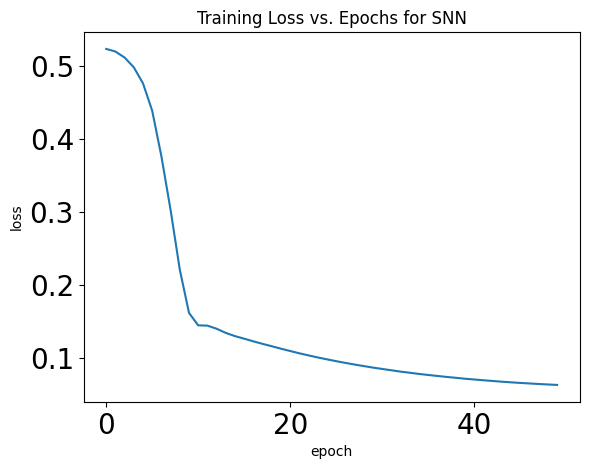

In [58]:
non_spiking_model.compile(optimizer="adam",loss=loss)
non_spiking_model_epochs = non_spiking_model.fit(X_train,y_train,epochs=epochs,
                                                 batch_size=batch_size)
plot_training_loss(non_spiking_model_epochs, "SNN")

## Evaluate Non-Spiking Network Model using MAE, RMSE, and MAPE.

In [59]:
print("Pure Dense Layer Predictions for Training Set")
non_snn_pred_train = non_spiking_model.predict(X_train)
non_snn_pred_train = np.ndarray.flatten(non_snn_pred_train)
print("Pure Dense Layer Predictions for Testing Set")
non_snn_pred_test = non_spiking_model.predict(X_test)
non_snn_pred_test = np.ndarray.flatten(non_snn_pred_test)
non_snn_mae = mean_absolute_error(y_test, non_snn_pred_test)
print("MAE of Pure Dense Layer model = ",non_snn_mae)
non_snn_rmse =  mean_squared_error(y_test, non_snn_pred_test) ** 0.5
print("RMSE of Pure Dense Layer model = ", non_snn_rmse)
#rnn_r2_score = r2_score(y_test,rnn_predictions_test)
#print("R2 Score of RNN model = ",rnn_r2_score)
non_snn_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                        non_snn_pred_test)
print("MAPE Score of Pure Dense Layer model = {0} %".format(non_snn_mape_score))

Pure Dense Layer Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Pure Dense Layer Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE of Pure Dense Layer model =  0.14711339304128146
RMSE of Pure Dense Layer model =  0.1882382293627866
MAPE Score of Pure Dense Layer model = 29.34858547171819 %


## Reverse Transform Scaler to Convert to Real Values.

In [60]:
# First perform inverse transofrm and reshape.
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
non_snn_pred_train = non_snn_pred_train.reshape(-1, 1)
nsnn_pred_inv_train = scaler.inverse_transform(non_snn_pred_train)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
non_snn_pred_test = non_snn_pred_test.reshape(-1, 1)
nsnn_pred_inv_test = scaler.inverse_transform(non_snn_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
nsnn_pred_inv_train = nsnn_pred_inv_train.flatten()

y_test_inverse = y_test_inverse.flatten()
nsnn_pred_inv_test = nsnn_pred_inv_test.flatten()

## Show Actual and Predicted y values as Dataframes.

### With Training Dates.

In [61]:
first_6169_index_dates = df.index[:X_train.shape[0]]
results_nSNN_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': nsnn_pred_inv_train})
results_nSNN_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,62.785164
1,2023-03-06 01:00:00,66.153566,63.129955
2,2023-03-06 02:00:00,66.090926,62.966061
3,2023-03-06 03:00:00,65.942371,61.469913
4,2023-03-06 04:00:00,66.077982,59.702278
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,63.396450
7032,2023-12-24 01:00:00,67.723487,63.959484
7033,2023-12-24 02:00:00,67.931737,64.644318
7034,2023-12-24 03:00:00,68.041604,65.502449


### With Testing Dates.

In [62]:
last_6169_index_dates = df.index[-X_test.shape[0]:]
results_nSNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': nsnn_pred_inv_test})
results_nSNN_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,65.982391
1,2023-12-25 02:00:00,67.699903,66.915451
2,2023-12-25 03:00:00,66.963961,66.422569
3,2023-12-25 04:00:00,67.132987,67.110336
4,2023-12-25 05:00:00,67.516792,67.145317
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,63.661148
1735,2024-03-06 08:00:00,53.606866,61.533752
1736,2024-03-06 09:00:00,56.729354,57.654858
1737,2024-03-06 10:00:00,60.111626,55.115917


## Plotting Predictions for PeMS Dataset Output made by Non-Spiking Model.
Used for Comparing Training and Testing Data Visually.

### Only Testing Data.

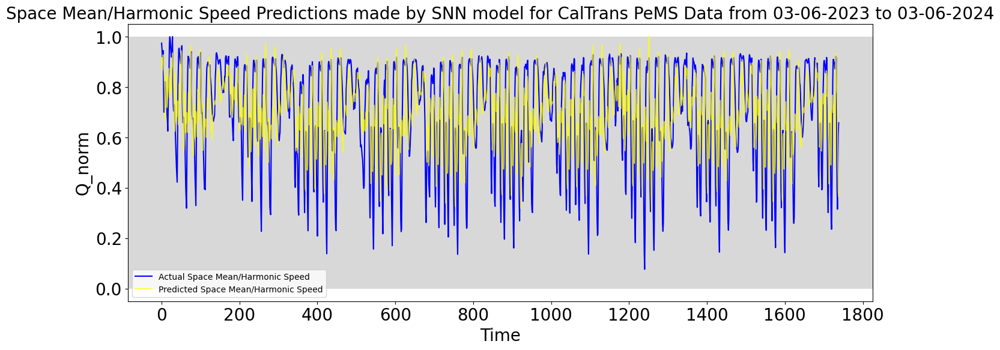

In [63]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(non_snn_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by SNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

### Training and Testing Data combined.

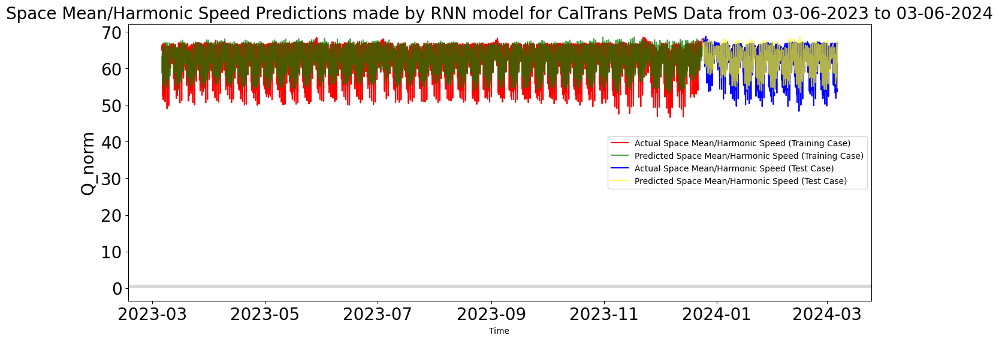

In [64]:
plt.figure(figsize=(16,6))
plt.plot(results_nSNN_train['Date'], results_nSNN_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_nSNN_train['Date'],  results_nSNN_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_nSNN_test['Date'], results_nSNN_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_nSNN_test['Date'], results_nSNN_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by RNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.xlabel('Time', fontsize = 10)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

## Combine Actual and Predicted Results for Train and Test Cases for Non Spiking Neural Network.

In [65]:
results_nSNN = [results_nSNN_train, results_nSNN_test]
results_nSNN = pd.concat(results_nSNN)
display(results_nSNN)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,62.785164
1,2023-03-06 01:00:00,66.153566,63.129955
2,2023-03-06 02:00:00,66.090926,62.966061
3,2023-03-06 03:00:00,65.942371,61.469913
4,2023-03-06 04:00:00,66.077982,59.702278
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,63.661148
1735,2024-03-06 08:00:00,53.606866,61.533752
1736,2024-03-06 09:00:00,56.729354,57.654858
1737,2024-03-06 10:00:00,60.111626,55.115917


## Plotting Residuals for Actual and Predicted Results for Non-Spiking Model.

This is to check for whether the model has adequately captured the information of the data.

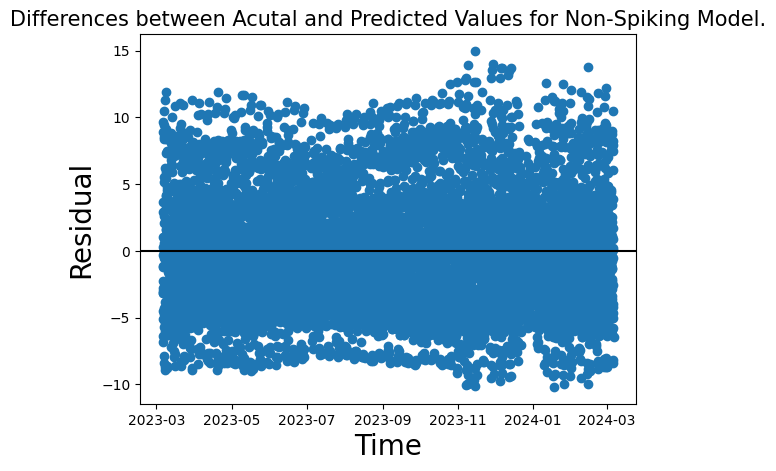

In [66]:
actual_arr_nSNN = np.array(results_nSNN['Actual'])
predicted_arr_nSNN = np.array(results_nSNN['Predicted'])
residuals_nSNN = predicted_arr_nSNN - actual_arr_nSNN
plt.scatter(results_nSNN['Date'], residuals_nSNN)
plt.axhline(y=0, color = 'black')
plt.title("Differences between Acutal and Predicted Values for Non-Spiking Model.",
          fontsize = 15)
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.show()

# Spiking Network model

## Create SNN Model.

### Spiking Activation Layer

In [67]:
class SpikingActivationCell(tf.keras.layers.Layer):
    def __init__(self, activation='tanh', threshold=1.0, dt=1.0, spiking_aware_training=False, **kwargs):
        super(SpikingActivationCell, self).__init__(**kwargs)
        self.activation = activation
        self.threshold = threshold
        self.dt = dt
        self.spiking_aware_training = spiking_aware_training
        self.state_size = 1  # State to store membrane potential

    def build(self, input_shape):
        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(input_shape[-1],),
            initializer='zeros',
            trainable=False
        )
        super(SpikingActivationCell, self).build(input_shape)

    def call(self, inputs, states, training=None):
        prev_membrane_potential = states[0]

        # Apply activation function
        activated_input = tf.keras.activations.get(self.activation)(inputs)

        # Update membrane potential
        membrane_potential = prev_membrane_potential + activated_input * self.dt

        # Generate spikes based on threshold
        if training and self.spiking_aware_training:
            # Use a surrogate gradient during training
            # This is a common surrogate gradient (Heaviside step function with identity gradient)
            spikes = tf.where(membrane_potential >= self.threshold,
                              tf.ones_like(membrane_potential),
                              tf.zeros_like(membrane_potential))
            # Define the surrogate gradient
            @tf.custom_gradient
            def surrogate_spike(x):
                spike = tf.where(x >= self.threshold, tf.ones_like(x), tf.zeros_like(x))
                def grad(dy):
                    # Here we use an identity gradient for simplicity, you might use others
                    return dy
                return spike, grad
            spikes = surrogate_spike(membrane_potential)
        else:
            # Use standard spiking during inference/evaluation
            spikes = tf.cast(membrane_potential >= self.threshold, dtype=tf.float32)

        # Reset membrane potential after spike
        membrane_potential = membrane_potential - spikes * self.threshold

        # Return the spikes and the updated membrane potential as the new state
        return spikes, [membrane_potential]

class SpikingActivationLayer(tf.keras.layers.RNN):
    def __init__(self, activation='tanh', threshold=1.0, dt=1.0, spiking_aware_training=False, **kwargs):
        cell = SpikingActivationCell(activation=activation, threshold=threshold,
                                     dt=dt, spiking_aware_training=spiking_aware_training)
        super(SpikingActivationLayer, self).__init__(cell, **kwargs)

    def call(self, inputs, initial_state=None, training=None, **kwargs):
        # Get the input shape
        input_shape = tf.shape(inputs)
        batch_size = input_shape[0]
        num_features = input_shape[-1]

        # Initialize the state if it's not provided
        if initial_state is None:
            # The initial state for the cell is a list of tensors. Since state_size is 1,
            # the initial state should be a list containing one tensor.
            initial_state = [tf.zeros((batch_size, num_features), dtype=tf.float32)]

        # Call the RNN with the correct initial state and training flag
        # The training flag from the layer's call method is passed to the cell's call method
        return super(SpikingActivationLayer, self).call(inputs,
                                                        initial_state=initial_state,
                                                        training=training,
                                                        **kwargs)

    # This method is usually called internally by Keras to determine the shape
    # of the output tensor. It should align with the arguments received in the
    # `call()` method. Based on the error, the argument `sequences_shape` should
    # be aligned with the `inputs` argument of `call()`.
    def compute_output_shape(self, input_shape):
        return input_shape

    # Override the build method to accept and ignore the sequences_shape argument
    # This is often not needed for RNN layers that handle variable length sequences,
    # but keeping it here for consistency with your original code structure.
    def build(self, input_shape):
        # Call the parent class's build method, passing only the input_shape
        super(SpikingActivationLayer, self).build(input_shape)

### Spiking Model

In [68]:
spiking_model = tf.keras.Sequential(
    [
        # Add temporal dimension to model. For this dataset, the input_shape is
        # passed into the model.
        tf.keras.layers.Reshape((-1, X_train.shape[1]),
                                input_shape=(None, X_train.shape[1])),
        # Keras' TimeDistributed wrapper allows Dense layer to operate on
        # temporal data.
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(128)),
        # SpikingActivation: Function replaces any activation function with it's
        # Spiking equivalent. In addition to activation functions, the timestep
        # (dt) can be changed to run the spiking neurons for longer periods of
        # time. spiking_aware_training is set to True as it helps in the
        # regularization.
        #keras_spiking.SpikingActivation("tanh", dt = 100,
        #                                spiking_aware_training=True),
        # SpikingActivation: Function replaces any activation function with it's
        # Spiking equivalent. In addition to activation functions, the timestep
        # (dt) can be changed to run the spiking neurons for longer periods of
        # time. spiking_aware_training is set to True as it helps in the
        # regularization.
        # Instead of using the keras_spiking.SpikingActivation, we directly
        # apply the activation function using tf.keras.activations.tanh.
        # This change avoids the internal use of tf.keras.layers.RNN
        # within the SpikingActivation layer, which was causing the issue.
        SpikingActivationLayer(activation='tanh', threshold=0.7, dt=100,
                               return_sequences=True,
                               spiking_aware_training=True),
        # GlobalAveragePooling1D: Averages spiking output over time. Used for
        # determining the spiking rate of neuron.
        tf.keras.layers.GlobalAveragePooling1D(),
        tf.keras.layers.Dense(1),
    ]
)

spiking_model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_1 (Reshape)             │ (None, None, 20)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed                │ (None, None, 128)      │         2,688 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spiking_activation_layer        │ (None, None, 128)      │           128 │
│ (SpikingActivationLayer)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,945 (11.50 KB)

 Trainable params: 2,817 (11.00 KB)

 Non-trainable params: 128 (512.00 B)

## Train Spiking Network Model.

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.4014
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1986
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.1354
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1057
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0834
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0762
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0691
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0648
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0611
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0572
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0539
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0510
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.0490
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0474
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.0454
Epoch 16/50
8/8 ━━━━━━━━━━━━━━━━━━

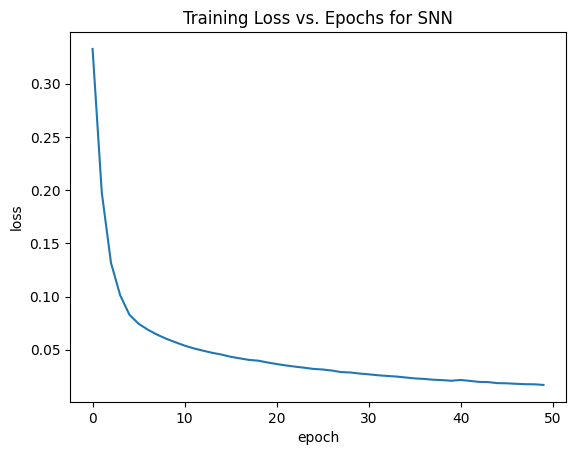

In [69]:
spiking_model.compile(optimizer="adam",loss=loss)
spiking_model_epochs = spiking_model.fit(X_train, y_train, epochs=epochs,
                           batch_size=batch_size)
plot_training_loss(spiking_model_epochs, "SNN")

## Evaluate  SNN Model using MAE, RMSE, and MAPE.

In [70]:
print("Rate-Based SNN Predictions for Training Set")
snn_pred_train = spiking_model.predict(X_train)
print("SNN Predictions for Testing Set")
snn_pred_test = spiking_model.predict(X_test)
snn_mae = mean_absolute_error(y_test, snn_pred_test)
print("MAE of SNN model = ",snn_mae)
snn_rmse =  mean_squared_error(y_test, snn_pred_test) ** 0.5
print("RMSE of SNN model = ",snn_rmse)
#rnn_r2_score = r2_score(y_test,rnn_predictions_test)
#print("R2 Score of RNN model = ",rnn_r2_score)
snn_mape_score = 100*mean_absolute_percentage_error(y_test, snn_pred_test)
print("MAPE Score of SNN model = {0} %".format(snn_mape_score))

Rate-Based SNN Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
SNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
MAE of SNN model =  0.10971401683236595
RMSE of SNN model =  0.13733918798996114
MAPE Score of SNN model = 19.196627084382104 %


## Reverse Transform Scaler to Convert to Real Values.

In [71]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
snn_pred_inv_train = scaler.inverse_transform(snn_pred_train)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
snn_pred_inv_test = scaler.inverse_transform(snn_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
snn_pred_inv_train = snn_pred_inv_train.flatten()

y_test_inverse = y_test_inverse.flatten()
snn_pred_inv_test = snn_pred_inv_test.flatten()

## Show Actual and Predicted y values as Dataframes.

### With Training Dates.

In [72]:
first_6169_index_dates = df.index[:X_train.shape[0]]
results_SNN_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': snn_pred_inv_train})
results_SNN_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,68.366234
1,2023-03-06 01:00:00,66.153566,67.744850
2,2023-03-06 02:00:00,66.090926,63.722107
3,2023-03-06 03:00:00,65.942371,68.306946
4,2023-03-06 04:00:00,66.077982,68.761749
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,68.177010
7032,2023-12-24 01:00:00,67.723487,66.817497
7033,2023-12-24 02:00:00,67.931737,63.747124
7034,2023-12-24 03:00:00,68.041604,65.206337


### With Testing Dates.

In [73]:
last_6169_index_dates = df.index[-X_test.shape[0]:]
results_SNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': snn_pred_inv_test})
results_SNN_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,68.051956
1,2023-12-25 02:00:00,67.699903,66.678955
2,2023-12-25 03:00:00,66.963961,65.869507
3,2023-12-25 04:00:00,67.132987,67.443016
4,2023-12-25 05:00:00,67.516792,62.894680
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,58.006744
1735,2024-03-06 08:00:00,53.606866,59.286884
1736,2024-03-06 09:00:00,56.729354,54.798618
1737,2024-03-06 10:00:00,60.111626,54.516315


## Plotting Predictions for PeMS Dataset Output made by SNN Model.

### Only Testing Data.

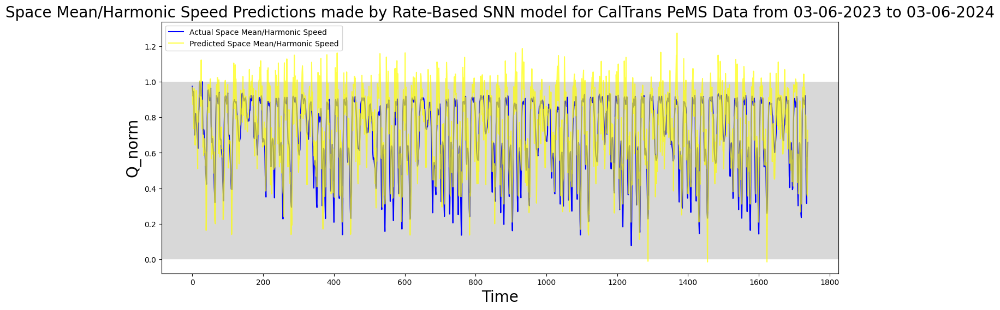

In [74]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(snn_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by Rate-Based SNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

### Training and Testing Data combined.

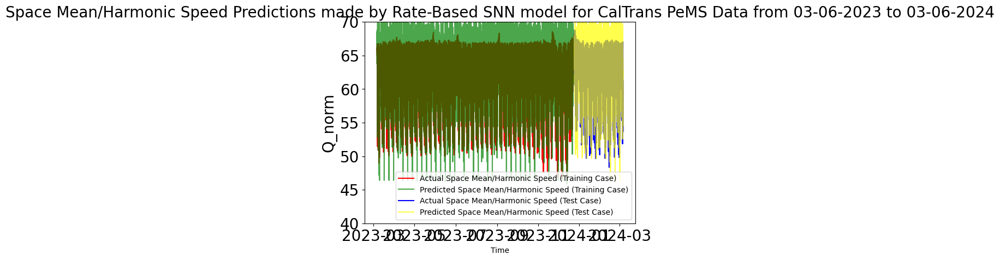

In [75]:
plt.plot(results_SNN_train['Date'], results_SNN_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_SNN_train['Date'],  results_SNN_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_SNN_test['Date'], results_SNN_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_SNN_test['Date'], results_SNN_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by Rate-Based SNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.xlabel('Time', fontsize = 10)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

## Combine Actual and Predicted Results for Train and Test Cases for SNN.

In [76]:
results_SNN = [results_SNN_train, results_SNN_test]
results_SNN = pd.concat(results_SNN)
display(results_SNN)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,68.366234
1,2023-03-06 01:00:00,66.153566,67.744850
2,2023-03-06 02:00:00,66.090926,63.722107
3,2023-03-06 03:00:00,65.942371,68.306946
4,2023-03-06 04:00:00,66.077982,68.761749
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,58.006744
1735,2024-03-06 08:00:00,53.606866,59.286884
1736,2024-03-06 09:00:00,56.729354,54.798618
1737,2024-03-06 10:00:00,60.111626,54.516315


## Plot Output Spikes
Code taken from https://pythontic.com/visualization/charts/spikerasterplot#:~:text=A%20Spike%20raster%20plot%20is%20a%20plot%20used,potential%20from%20a%20neuron%20at%20a%20specified%20position.

In [77]:
def check_output(seq_model, X_train, X_test, y_train, y_test, modify_dt=0.1):
    """
    This code is used to show the plot of the output spikes for the
    SpikingActivation Layer.
    """

    # Repeat the outputs for n_steps.
    n_steps = 10
    train_sequences = np.tile(X_train[:, None], (1, n_steps, 1, 1))
    test_sequences = np.tile(X_test[:, None], (1, n_steps, 1, 1))

    # Rebuild the model with the functional API to access the output of
    # intermediate layers.
    inp = x = tf.keras.Input(batch_shape=seq_model.layers[0].input_shape)
    has_global_average_pooling = False
    # Obtain list of layers to create a spike matrix.
    spikes_dict = {}
    layer_names = []
    print("length of seq_model.layers: ", len(seq_model.layers))
    for layer in seq_model.layers:
        print("layer type: ", type(layer))
        print("layer name: ", layer.name)
        if "_1" in layer.name:
          layer_new_name = str(layer.name).replace("_1", "")
          print("layer new name: ", layer_new_name)
          layer_names.append(layer_new_name)
        else:
          layer_names.append(str(layer.name))
        if isinstance(layer, tf.keras.layers.GlobalAveragePooling1D):
            # Remove the pooling so that we can see the model's output over
            # time.
            has_global_average_pooling = True
            continue

        if isinstance(layer, (keras_spiking.SpikingActivation,
                              keras_spiking.Lowpass)):

            cfg = layer.get_config()
            # Update dt, if specified
            if modify_dt is not None:
                cfg["dt"] = modify_dt
            # Return the full time series for visualization
            cfg["return_sequences"] = True

            layer = type(layer)(**cfg)

        if isinstance(layer, keras_spiking.SpikingActivation):
            # save this layer so we can access it later
            spike_layer = layer

        x = layer(x)

    # Initialize spikes_dict with layer names as keys
    for layer_name in layer_names:
        spikes_dict[layer_name] = np.array([]) # Initialize as empty array

    layer_names.append("Output")
    spikes_dict["Output"] = np.array([])

    # Take a look at Spiking Activation Layer.
    func_model = tf.keras.Model(inp, [x, spike_layer.output])

    # Copy weights to new model
    func_model.set_weights(seq_model.get_weights())

    # Run model
    output, spikes = func_model.predict(test_sequences)
    spikes = np.transpose(spikes, (0, 2, 1))
    print("spikes.shape: ", spikes.shape)

    # Iterate through layer list
    for i in range(spikes.shape[0]):
      for j in range(len(layer_names)):
        # Append spike data for each layer, handling potential empty arrays
        if spikes_dict[layer_names[j]].size == 0:
            spikes_dict[layer_names[j]] = spikes[i][j]
        else:
            spikes_dict[layer_names[j]] = np.concatenate((spikes_dict[layer_names[j]],
                                                    spikes[i][j]), axis = 0)

    print("spikes_dict: ", spikes_dict)

    if has_global_average_pooling:
        # Check test accuracy using average output over all timesteps
        predictions = np.argmax(output.mean(axis=1), axis=-1)
    else:
        # Check test accuracy using output from only the last timestep
        predictions = np.argmax(output[:, -1], axis=-1)

    print("spike_layer.dt: ", spike_layer.dt)
    # Evaluate Test Data
    seq_model_mae = mean_absolute_error(y_test, snn_pred_test)
    print("MAE of seq_model = ", seq_model_mae)
    seq_model_rmse = mean_absolute_error(y_test, snn_pred_test)**0.5
    print("RMSE of seq_model = ", seq_model_rmse)
    seq_model_mape = 100*mean_absolute_percentage_error(y_test, snn_pred_test)
    print("MAPE of seq_model = ", seq_model_mape)

    # Start Output Spike Plot.
    num_neurons = 10
    print("spikes for spiking_activation: ", spikes_dict['spiking_activation'])
    spikes_matrix = spikes_dict['spiking_activation']*20*modify_dt
    print("spikes_matrix.shape: ", spikes_matrix.shape)
    spikes_matrix = spikes_matrix.reshape(spikes.shape[0], n_steps)
    print("spikes_matrix.shape: ", spikes_matrix.shape)
    neurons = np.random.choice(spikes_matrix.shape[1], num_neurons, replace=True)
    print("neurons: ", neurons)
    print("neurons.shape: ", neurons.shape)

    fig, ax = plt.subplots(figsize=(14, 12), facecolor="#00FFFF")
    color = cm.get_cmap('tab10')(0)
    timesteps = np.arange(n_steps)
    print("timesteps shape: ", timesteps.shape)
    print("timesteps: {0}".format(timesteps))
    for i in range(num_neurons):
      print("i: ", i)
      indices = np.where(spikes_matrix[:, i] != 0)
      list_of_indices = [list(row) for row in zip(*indices)]
      print("list of indices: ", list_of_indices)
      flat_list = []
      for row in list_of_indices:
          flat_list.extend(row)
      print("flat_list: ", flat_list)
      #print("spike matrix where shape: ", len(np.where(spikes_matrix[:, i] != 0)))
      #output_spikes_list = list((np.where(spikes_matrix[:, i] != 0)))
      #print("output_spikes_list: ", output_spikes_list)
      #print(timesteps[np.where(spikes_matrix[:, i] != 0)])
      for t in flat_list:
        #if (t < n_steps):
        ax.plot([t, t], [i+0.5, i+1.5], color=color)
          #ax.eventplot([t,], [i + 0.5, i + 0.5])
        #ax.eventplot([t, t], lineoffsets=[i+0.5, i+1.5], linelengths=1, colors=color)

    ax.set_ylim(0.5, num_neurons+0.5)
    #ax.set_yticks(list(range(1, num_neurons+1, int(np.ceil(num_neurons/50)))))
    ax.set_yticks(list(range(1, num_neurons + 1)))  # Adjust y-axis ticks
    #ax.set_xticks(list(range(1, n_steps+1, 10)))
    ax.set_ylabel("Neuron Index", fontsize = 15)
    ax.set_xlabel("Time in $ms$", fontsize = 15)
    ax.set_title("Dense Spiking Activation Layer Spikes Plot", fontsize = 15)

In [78]:
#check_output(spiking_model, X_train, X_test, y_train, y_test)

In [79]:
#check_output(spiking_model, X_train, X_test, y_train, y_test, modify_dt = 100)

## Plotting Residuals for Actual and Predicted Results for SNN.

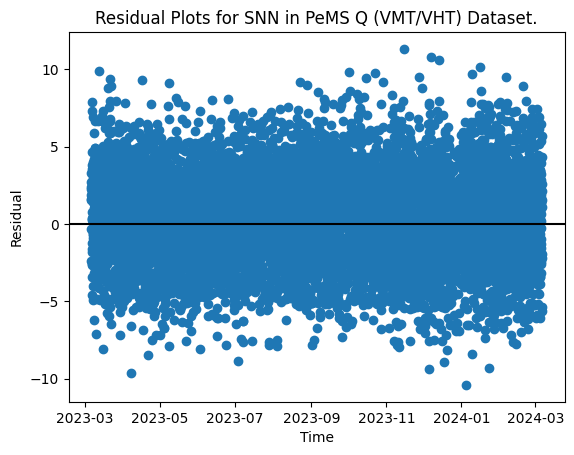

In [80]:
actual_arr_SNN = np.array(results_SNN['Actual'])
predicted_arr_SNN = np.array(results_SNN['Predicted'])
residuals_SNN = predicted_arr_SNN - actual_arr_SNN
plt.scatter(results_SNN['Date'], residuals_SNN)
plt.axhline(y=0, color = 'black')
plt.title("Residual Plots for SNN in PeMS {} Dataset.".format(feature_field))
plt.xlabel("Time")
plt.ylabel("Residual")
plt.show()

From the residual plots for the RNN model, it can be concluded that the RNN model is a good fit.

# Spiking Network Model with LIF.

## Create SNN with LIF Class.

### Creating LIF Neuron Class.

In [81]:
class LIFNeuron(tf.keras.layers.Layer):
    def __init__(self, threshold=0.5, leak_rate=0.001, **kwargs):
        super(LIFNeuron, self).__init__(**kwargs)
        self.threshold = threshold
        self.leak_rate = leak_rate

    def build(self, input_shape):
        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(input_shape[-1],),  # Shape based on input features
            initializer='zeros',
            trainable=False
        )

    def call(self, inputs):
        input_shape = tf.shape(inputs)
        batch_size = input_shape[0]
        seq_len = input_shape[1]
        num_features = input_shape[2]

        # Initialize batch of membrane potentials
        batch_membrane_potential = tf.tile(
            tf.expand_dims(self.membrane_potential, axis=0),
            [batch_size, 1]
        )

        # Initialize output tensor
        outputs = tf.TensorArray(dtype=tf.float32, size=seq_len)

        # Iterate over time steps using tf.while_loop
        t = tf.constant(0)
        while_condition = lambda t, outputs, batch_membrane_potential: tf.less(t, seq_len)

        def while_body(t, outputs, batch_membrane_potential):
            current_input = inputs[:, t, :]
            batch_membrane_potential = batch_membrane_potential * (1 - self.leak_rate) + current_input
            spikes = tf.cast(batch_membrane_potential >= self.threshold, dtype=tf.float32)
            batch_membrane_potential = batch_membrane_potential * (1 - spikes)
            outputs = outputs.write(t, spikes)
            t = tf.add(t, 1)
            return t, outputs, batch_membrane_potential

        _, outputs, _ = tf.while_loop(while_condition, while_body, [t, outputs, batch_membrane_potential])

        outputs = outputs.stack()  # Stack the outputs from the TensorArray
        outputs = tf.transpose(outputs, [1, 0, 2])  # Reshape to (batch_size, seq_len, num_features)

        return outputs

### Create SpikingActivation Class.

Due to the depreciation of keras_spiking.SpikingActivation, a custom SpikingActivation class is provided below prior to creating the model.

In [82]:
class SpikingActivationCell(tf.keras.layers.Layer):
    def __init__(self, activation='tanh', threshold=1.0, **kwargs):
        super(SpikingActivationCell, self).__init__(**kwargs)
        self.activation = activation
        self.threshold = threshold
        self.state_size = 1  # State to store membrane potential

    def build(self, input_shape):
        # The membrane_potential should have the shape of the input features.
        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(input_shape[-1],),  # Match the input feature shape
            initializer='zeros',
            trainable=False
        )
        super(SpikingActivationCell, self).build(input_shape)

    def call(self, inputs, states):
        prev_membrane_potential = states[0]

        # Apply activation function
        activated_input = tf.keras.activations.get(self.activation)(inputs)

        # Update membrane potential
        membrane_potential = prev_membrane_potential + activated_input

        # Generate spikes based on threshold
        spikes = tf.cast(membrane_potential >= self.threshold, dtype=tf.float32)

        # Reset membrane potential after spike
        membrane_potential = membrane_potential - spikes * self.threshold

        # Return the spikes and the updated membrane potential as the new state
        return spikes, [membrane_potential]

class SpikingActivationLayer(tf.keras.layers.RNN):
    def __init__(self, activation='tanh', threshold=1.0, **kwargs):
        cell = SpikingActivationCell(activation=activation, threshold=threshold)
        super(SpikingActivationLayer, self).__init__(cell, **kwargs)

### Create Model

In [83]:
spiking_LIF_model = tf.keras.Sequential(
    [
        # Add temporal dimension to model. For this dataset, the input_shape is
        # passed into the model.
        tf.keras.layers.Reshape((-1, X_train.shape[1]),
                                input_shape=(None, X_train.shape[1])),
        # Keras' TimeDistributed wrapper allows Dense layer to operate on
        # temporal data.
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(128)),
        # SpikingActivation: Function replaces any activation function with it's
        # Spiking equivalent. In addition to activation functions, the timestep
        # (dt) can be changed to run the spiking neurons for longer periods of
        # time. spiking_aware_training is set to True as it helps in the
        # regularization.
        #keras_spiking.SpikingActivation("tanh", dt = 100,
        #                                spiking_aware_training=True),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        #LIFNeuron(threshold=0.5, leak_rate=0.0001),
        #LIFNeuron(threshold=0.5, leak_rate=0.001),
        #tf.keras.layers.Dropout(0.1),  # Added dropout
        #LIFNeuron(threshold=0.7, leak_rate=0.02),
        LIFNeuron(threshold=0.5, leak_rate=0.01),
        #tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(64)),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        #LIFNeuron(threshold=0.5, leak_rate=0.01),
        #tf.keras.layers.Dropout(0.009),  # Added dropout
        #LIFNeuron(threshold=0.5, leak_rate=0.01),
        #tf.keras.layers.Dropout(0.1),  # Added dropout
        #LIFNeuron(threshold=1.0, leak_rate=0.01),
        #tf.keras.layers.Dropout(0.1),  # Added dropout
        #RateBasedSoftmax(time_window=10),
        # GlobalAveragePooling1D: Averages spiking output over time. Used for
        # determining the spiking rate of neuron.
        #keras_spiking.SpikingActivation("tanh", dt = 100,
        #                                spiking_aware_training=True),
        #tf.keras.layers.Activation(tf.keras.activations.tanh),
        #SpikingActivation(activation=tf.keras.activations.tanh, dt = 100,
        #                  spiking_aware_training=True),
        #spiking_LIFv3_model.add(SpikingActivation(activation=tf.keras.activations.tanh, dt=1.0, spiking_aware_training=True)),
        tf.keras.layers.GlobalAveragePooling1D(),
        #tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1),
    ]
)

spiking_LIF_model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_2 (Reshape)             │ (None, None, 20)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_1              │ (None, None, 128)      │         2,688 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lif_neuron (LIFNeuron)          │ (None, None, 128)      │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_1      │ (None, 128)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,945 (11.50 KB)

 Trainable params: 2,817 (11.00 KB)

 Non-trainable params: 128 (512.00 B)

Number of Neurons for Dense Layer

In [84]:
dense_layer = spiking_LIF_model.layers[1].layer  # Access the Dense layer within TimeDistributed
num_dense_neurons = dense_layer.units
print(f"Number of neurons in Dense layer: {num_dense_neurons}")

Number of neurons in Dense layer: 128


Number of Neurons for LIF Layer

In [85]:
#lif_layer = spiking_LIF_model.layers[2].layer  # Access the LIFNeuron layer
#num_lif_neurons = lif_layer.units
#print(f"Number of neurons in LIFNeuron layer: {num_lif_neurons}")

## Training SNN LIF Model.

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 0.8191
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.6461
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.5042
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.3891
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.3047
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.2347
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1988
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1726
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.1509
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - loss: 0.1384
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.1310
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1217
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1170
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 0.1112
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.1059
Epoch 16/50
8/8 ━━━━━━━━━━━━━━━━━━

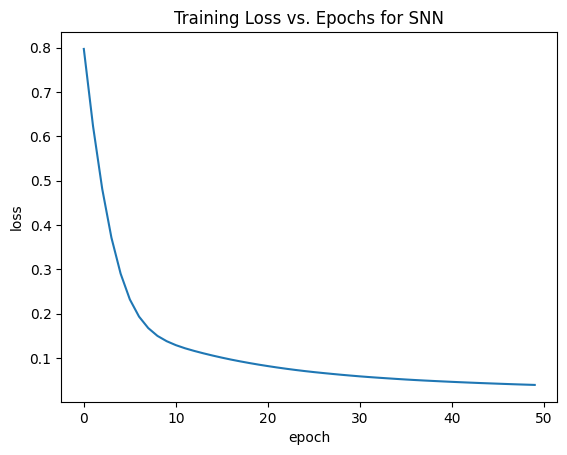

In [86]:
# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
spiking_LIF_model.compile(optimizer='adam', loss=loss)
#spiking_LIF_model.compile(optimizer=optimizer, loss=loss)
spiking_model_LIF_epochs = spiking_LIF_model.fit(X_train,y_train,epochs=epochs,
                                                 batch_size=batch_size)
plot_training_loss(spiking_model_LIF_epochs, "SNN")

## Evaluate SNN LIF Model using MAE, RMSE, and MAPE.

In [87]:
print("Dense LIF SNN Predictions for Training Set")
snn_LIF_pred_train = spiking_LIF_model.predict(X_train)
print("Dense LIF SNN Predictions for Testing Set")
snn_LIF_pred_test = spiking_LIF_model.predict(X_test)
print(snn_LIF_pred_test.shape)
snn_LIF_mae = mean_absolute_error(y_test, snn_LIF_pred_test)
print("MAE of LIF SNN  model = ",snn_LIF_mae)
snn_LIF_rmse =  mean_squared_error(y_test, snn_LIF_pred_test) ** 0.5
print("RMSE of LIF SNN model = ",snn_LIF_rmse)
#rnn_r2_score = r2_score(y_test,rnn_predictions_test)
#print("R2 Score of RNN model = ",rnn_r2_score)
snn_LIF_mape_score = 100*mean_absolute_percentage_error(y_test, snn_LIF_pred_test)
print("MAPE Score of LIF SNN model = {0} %".format(snn_LIF_mape_score))

Dense LIF SNN Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Dense LIF SNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
(1739, 1)
MAE of LIF SNN  model =  0.15798267482464168
RMSE of LIF SNN model =  0.19491715762533493
MAPE Score of LIF SNN model = 30.090832134433704 %


## Reverse Transform Scaler to Convert to Real Values.

In [88]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
snn_LIF_pred_inv_train = scaler.inverse_transform(snn_LIF_pred_train)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
snn_LIF_pred_inv_test = scaler.inverse_transform(snn_LIF_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
snn_LIF_pred_inv_train = snn_LIF_pred_inv_train.flatten()

y_test_inverse = y_test_inverse.flatten()
snn_LIF_pred_inv_test = snn_LIF_pred_inv_test.flatten()

## Show Actual and Predicted y values as Dataframes.

### With Training Dates.

In [89]:
first_6169_index_dates = df.index[:X_train.shape[0]]
results_SNN_LIF_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': snn_LIF_pred_inv_train})
results_SNN_LIF_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,59.402592
1,2023-03-06 01:00:00,66.153566,63.583477
2,2023-03-06 02:00:00,66.090926,67.156898
3,2023-03-06 03:00:00,65.942371,68.151596
4,2023-03-06 04:00:00,66.077982,67.663094
...,...,...,...
7031,2023-12-24 00:00:00,65.671119,56.182678
7032,2023-12-24 01:00:00,67.723487,61.437065
7033,2023-12-24 02:00:00,67.931737,61.437065
7034,2023-12-24 03:00:00,68.041604,67.044464


### With Testing Dates.

In [90]:
last_6169_index_dates = df.index[-X_test.shape[0]:]
results_SNN_LIF_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': snn_LIF_pred_inv_test})
results_SNN_LIF_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,68.171553,62.863571
1,2023-12-25 02:00:00,67.699903,66.161606
2,2023-12-25 03:00:00,66.963961,66.161606
3,2023-12-25 04:00:00,67.132987,62.143135
4,2023-12-25 05:00:00,67.516792,61.240967
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,62.457981
1735,2024-03-06 08:00:00,53.606866,58.953495
1736,2024-03-06 09:00:00,56.729354,60.500980
1737,2024-03-06 10:00:00,60.111626,59.837204


## Plotting Predictions for PeMS Dataset Output made by SNN LIF Model.

### Only Testing Data.

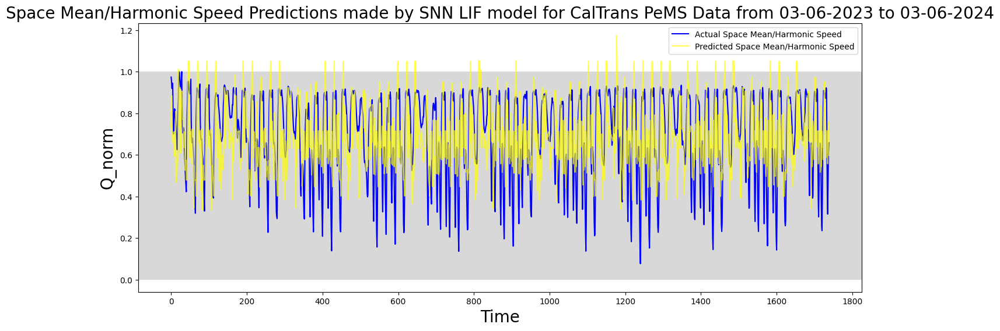

In [91]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(snn_LIF_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by SNN LIF model for {1}".
          format(feature, title_name), fontsize = 20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

### Training and Testing Data combined.

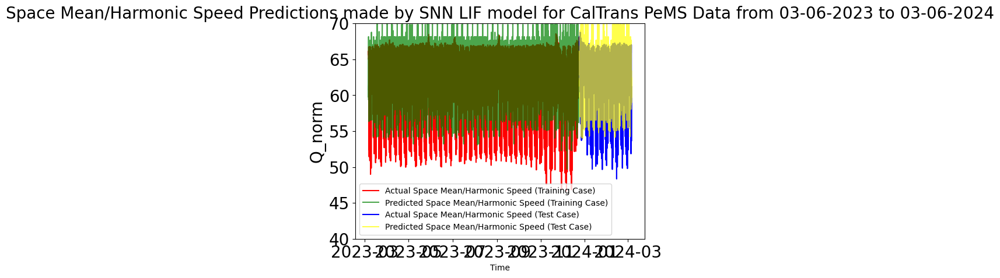

In [92]:
plt.plot(results_SNN_LIF_train['Date'], results_SNN_LIF_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_SNN_LIF_train['Date'],  results_SNN_LIF_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_SNN_LIF_test['Date'], results_SNN_LIF_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_SNN_LIF_test['Date'], results_SNN_LIF_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by SNN LIF model for {1}".
          format(feature, title_name), fontsize = 20)
plt.xlabel('Time', fontsize = 10)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

## Combine Actual and Predicted Results for Train and Test Cases for SNN LIF Model.

In [93]:
results_SNN_LIF = [results_SNN_LIF_train, results_SNN_LIF_test]
results_SNN_LIF = pd.concat(results_SNN_LIF)
display(results_SNN_LIF)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,65.051331,59.402592
1,2023-03-06 01:00:00,66.153566,63.583477
2,2023-03-06 02:00:00,66.090926,67.156898
3,2023-03-06 03:00:00,65.942371,68.151596
4,2023-03-06 04:00:00,66.077982,67.663094
...,...,...,...
1734,2024-03-06 07:00:00,55.425174,62.457981
1735,2024-03-06 08:00:00,53.606866,58.953495
1736,2024-03-06 09:00:00,56.729354,60.500980
1737,2024-03-06 10:00:00,60.111626,59.837204


## Plot Output Spikes
Code taken from https://pythontic.com/visualization/charts/spikerasterplot#:~:text=A%20Spike%20raster%20plot%20is%20a%20plot%20used,potential%20from%20a%20neuron%20at%20a%20specified%20position.

In [94]:
#check_output(spiking_LIF_model, X_train, X_test, y_train, y_test)

## Plotting Residuals for Actual and Predicted Results for LIF SNN.

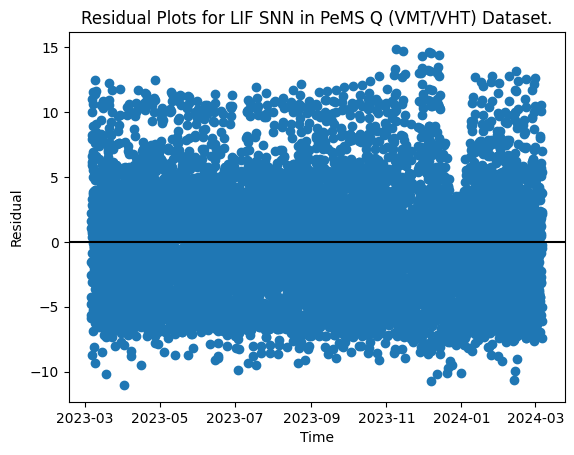

In [95]:
actual_arr_SNN_LIF = np.array(results_SNN_LIF['Actual'])
pred_arr_SNN_LIF = np.array(results_SNN_LIF['Predicted'])
residuals_SNN_LIF = pred_arr_SNN_LIF - actual_arr_SNN_LIF
plt.scatter(results_SNN_LIF['Date'], residuals_SNN_LIF)
plt.axhline(y=0, color = 'black')
plt.title("Residual Plots for LIF SNN in PeMS {} Dataset.".format(feature_field))
plt.xlabel("Time")
plt.ylabel("Residual")
plt.show()

# Spiking Network Model with LIF (Version 4)

## Create New SNN and LIF Class

### New LIF Class using Refractory Period

In [96]:
class LIFNeuronV3(tf.keras.layers.Layer):
  def __init__(self, threshold=1.0, leak_rate=0.05, refractory_period=5, **kwargs):
      super(LIFNeuronV3 , self).__init__(**kwargs)
      self.threshold = threshold
      self.leak_rate = leak_rate
      self.refractory_period = refractory_period
      self.membrane_potential = None
      self.return_sequences = True # Flag to return output sequence

  def build(self, input_shape):
    self.num_neurons = input_shape[-1]  # Store the number of neurons
    self.membrane_potential = self.add_weight(
          name='membrane_potential',
          #shape=(input_shape[0], input_shape[-1]),
          #shape=(None, self.num_neurons),
          #shape=(input_shape[1], input_shape[-1]),
          #shape=(seq_len, num_features),  # Use Python integers
          shape=(1, self.num_neurons),
          initializer='zeros',
          trainable=False

      )

    self.refractory_counter = self.add_weight(
            name='refractory_counter',
            shape = (),
            #shape=(self.num_neurons,),
            #shape=(1, self.num_neurons),
            initializer='zeros',
            trainable=False,
            dtype=tf.int32  # Ensure refractory_counter is an integer type
        )


  def call(self, inputs):
      input_shape = tf.shape(inputs)
      inputs = tf.reshape(inputs, (input_shape[0], input_shape[1], input_shape[2]))

      # Replace for loop with tf.while_loop
      def while_body(t, sample_outputs_ta, membrane_potential, refractory_counter, sample):
          current_input = tf.gather(sample, t, axis=0)  # Get input at time step t
          membrane_potential = membrane_potential * (1 - self.leak_rate) + current_input

          # Check refractory period
          spikes = tf.cond(
              refractory_counter > 0,
              lambda: tf.zeros_like(membrane_potential),
              lambda: tf.cast(membrane_potential >= self.threshold, dtype=tf.float32)
          )

          # Reset potential and update refractory counter
          reset_condition = tf.reduce_any(spikes > 0)
          membrane_potential = tf.cond(reset_condition,
                                      lambda: membrane_potential * (1 - spikes),
                                      lambda: membrane_potential)

          refractory_counter = tf.cond(reset_condition,
                                      #lambda: self.refractory_period,
                                      lambda: tf.constant(self.refractory_period, dtype=tf.int32),
                                      lambda: tf.maximum(0, refractory_counter - 1))

          # Reshape spikes before writing to TensorArray
          spikes = tf.reshape(spikes, (1, self.num_neurons))  # Shape as (1, num_neurons)
          sample_outputs_ta = sample_outputs_ta.write(t, spikes)

          return tf.add(t, 1), sample_outputs_ta, membrane_potential, refractory_counter, sample

      # Initialize loop variables
      t = tf.constant(0)
      max_time_steps = input_shape[1]

      # Execute the loop for each sample in the batch using tf.map_fn
      def process_sample(sample):
          # Initialize TensorArray inside process_sample
          sample_outputs_ta = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True)

          _, sample_outputs_ta, _, _, _ = tf.while_loop(
              lambda t, *_: tf.less(t, max_time_steps),
              while_body,
              [t, sample_outputs_ta, self.membrane_potential, self.refractory_counter, sample]
          )
          sample_outputs = sample_outputs_ta.stack()
          return sample_outputs

      # Use tf.map_fn to process each sample in the batch
      outputs = tf.map_fn(process_sample, inputs, dtype=tf.float32)

      return outputs

### Create Model

In [97]:
spiking_LIFv3_model = tf.keras.Sequential(
    [
        # Add temporal dimension to model. For this dataset, the input_shape is
        # passed into the model.
        tf.keras.layers.Reshape((-1, X_train.shape[1]),
                                input_shape=(None, X_train.shape[1])),
        # Keras' TimeDistributed wrapper allows Dense layer to operate on
        # temporal data.
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(128)),
        #tf.keras.layers.Dense(64, activation='tanh'),
        #LIFNeuronV3(threshold=1.25, leak_rate=0.06, refractory_period=5),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        LIFNeuronV3(threshold=0.5, leak_rate=0.01, refractory_period=275),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Reshape((-1, 128)),  # Reshape to (batch_size, time_steps, features)

        #tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(64)),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        #LIFNeuronV3(threshold=0.5, leak_rate=0.01, refractory_period=5),


        #tf.keras.layers.Dropout(0.01),  # Added dropout
        # Use tf.keras.layers.Permute to swap the time_steps and num_neurons dimensions
        #tf.keras.layers.Permute((2, 1)),  # Now shape is (batch_size, num_neurons, time_steps)
        #tf.keras.layers.Reshape((-1, 64)),  # Reshape to (batch_size, time_steps, num_neurons)
        # GlobalAveragePooling1D: Averages spiking output over time. Used for
        # determining the spiking rate of neuron.
        #keras_spiking.SpikingActivation("tanh", dt = 100,
        #                                spiking_aware_training=True),
        #SpikingActivation(activation=tf.keras.activations.tanh, dt = 100,
        #                  spiking_aware_training=True),
        tf.keras.layers.GlobalAveragePooling1D(),
        #tf.keras.layers.GlobalAveragePooling1D(data_format='channels_last'),
        #tf.keras.layers.Dense(future),
        #tf.keras.layers.Flatten(),  # Add Flatten layer
        #tf.keras.layers.Reshape((batch_size, 1)),  # Reshape to (batch_size, 1)
        #tf.keras.layers.Lambda(lambda x: x[:, -1]),
        tf.keras.layers.Dense(1),
        #tf.keras.layers.Dense(1, input_shape=(X_train.shape[1] * 64, )),

    ]

)

spiking_LIFv3_model.summary()

Instructions for updating:
Use fn_output_signature instead


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_3 (Reshape)             │ (None, None, 20)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_2              │ (None, None, 128)      │         2,688 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lif_neuron_v3 (LIFNeuronV3)     │ (None, None, 1, 128)   │           129 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, None, 1, 128)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_4 (Reshape)             │ (None, None, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_2      │ (None, 128)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,946 (11.51 KB)

 Trainable params: 2,817 (11.00 KB)

 Non-trainable params: 129 (516.00 B)

## Training SNN V4 Model.

Epoch 1/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 9s 557ms/step - loss: 0.3871
Epoch 2/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 432ms/step - loss: 0.3180
Epoch 3/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 419ms/step - loss: 0.2618
Epoch 4/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 641ms/step - loss: 0.2193
Epoch 5/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 453ms/step - loss: 0.1849
Epoch 6/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 436ms/step - loss: 0.1612
Epoch 7/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 6s 584ms/step - loss: 0.1399
Epoch 8/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 451ms/step - loss: 0.1315
Epoch 9/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 435ms/step - loss: 0.1234
Epoch 10/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 7s 705ms/step - loss: 0.1139
Epoch 11/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 8s 369ms/step - loss: 0.1110
Epoch 12/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 4s 461ms/step - loss: 0.1077
Epoch 13/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 6s 474ms/step - loss: 0.1041
Epoch 14/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 3s 422ms/step - loss: 0.1028
Epoch 15/50
8/8 ━━━━━━━━━━━━━━━━━━━━ 5s 458ms/step - loss: 0.1013
Epoch 16/50
8/8 ━━━

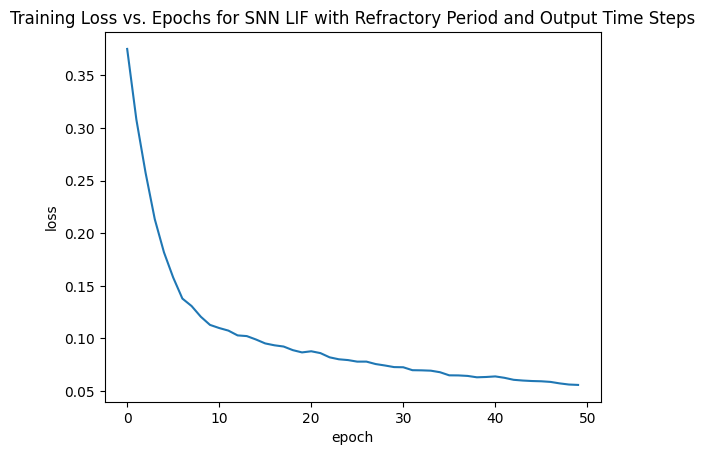

In [98]:
# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
spiking_LIFv3_model.compile(optimizer='adam', loss=loss)
spiking_LIFv3_model.compile(optimizer=optimizer, loss=loss)
spiking_LIFv3_model_epochs = spiking_LIFv3_model.fit(X_train,y_train,epochs=epochs,
                                                 batch_size=batch_size)
plot_training_loss(spiking_LIFv3_model_epochs, "SNN LIF with Refractory Period and Output Time Steps")

## Evaluating SNN V4 Model using MAE, RMSE, R2.

In [99]:
print("SNN v4 Predictions for Training Set")
spiking_LIFv3_model_pred_train = spiking_LIFv3_model.predict(X_train)
print("SNN v4 Predictions for Training Set")
spiking_LIFv3_model_pred_test = spiking_LIFv3_model.predict(X_test)
print(spiking_LIFv3_model_pred_test.shape)

# Reshape the model predictions if necessary
#spiking_LIFv3_model_pred_test = spiking_LIFv3_model_pred_test.reshape(y_test.shape)

spiking_LIFv3_model_mae = mean_absolute_error(y_test, spiking_LIFv3_model_pred_test)
print("MAE of SNN v4 model = ",spiking_LIFv3_model_mae)
spiking_LIFv3_model_rmse =  mean_squared_error(y_test, spiking_LIFv3_model_pred_test) ** 0.5
print("RMSE of SNN v4  model = ", spiking_LIFv3_model_rmse)
spiking_LIFv3_model_r2_score = r2_score(y_test, spiking_LIFv3_model_pred_test)
print("R2 Score of SNN v4 model = ", spiking_LIFv3_model_r2_score)
spiking_LIFv3_model_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                                    spiking_LIFv3_model_pred_test)
print("MAPE Score of SNN v4 model = {0} %".format(spiking_LIFv3_model_mape_score))

SNN v4 Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step
SNN v4 Predictions for Training Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
(1739, 1)
MAE of SNN v4 model =  0.15280001386653275
RMSE of SNN v4  model =  0.18563054621258168
R2 Score of SNN v4 model =  0.14830937351923656
MAPE Score of SNN v4 model = 27.16337076729223 %


# Compare Predictions

* For both models, we see that the predicted values are close to the actual values, which means that the models perform well in predicting the sequence.

## Training

In [100]:
#plt.figure(figsize=(15,8))

#plt.plot(y_train, c="black", linewidth=3, label="Original values")
#plt.plot(rnn_predictions_train, c="red", linewidth=3, label="LSTM predictions")
#plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
#plt.legend()
#plt.xlabel('Hour')
#plt.ylabel('Q')
#plt.title("Predictions(SNN) vs Actual Data (Training)",
#          fontsize=20)
#plt.show()

## Testing

In [101]:
#plt.figure(figsize=(15,8))

#plt.plot(y_test, c="black", linewidth=3, label="Original values")
#plt.plot(rnn_predictions_test, c="red", linewidth=3, label="LSTM predictions")
#plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
#plt.legend()
#plt.xlabel('Hour', fontsize = 20)
#plt.ylabel('Q', fontsize = 20)
#plt.title("Predictions(SNN) vs Actual Data (Test)",
#          fontsize=20)
#plt.show()

# Forecasting Future Data for all models

## Essential Functions.

In [102]:
# this section for unknown future.
future=seq_len
forecast_SNN = []
Xin = X_test[:,:,:]
Xin

array([[[0.91890749],
        [0.9199068 ],
        [0.92844702],
        ...,
        [0.96329094],
        [0.96826151],
        [0.96781635]],

       [[0.9199068 ],
        [0.92844702],
        [0.9259517 ],
        ...,
        [0.96826151],
        [0.96781635],
        [0.9741406 ]],

       [[0.92844702],
        [0.9259517 ],
        [0.89934155],
        ...,
        [0.96781635],
        [0.9741406 ],
        [0.95280242]],

       ...,

       [[0.64968194],
        [0.55970156],
        [0.37723423],
        ...,
        [0.61105245],
        [0.39747358],
        [0.31521033]],

       [[0.55970156],
        [0.37723423],
        [0.2574696 ],
        ...,
        [0.39747358],
        [0.31521033],
        [0.4564768 ]],

       [[0.37723423],
        [0.2574696 ],
        [0.23532842],
        ...,
        [0.31521033],
        [0.4564768 ],
        [0.60949634]]])

In [103]:
def insert_end(Xin, new_input, timestep):
    for i in range(timestep-1):
        Xin[:,i,:] = Xin[:,i+1,:]
    Xin[:,timestep-1,:] = new_input
    return Xin

def forecast_data(Xin, model_type, forecast, future_num):
    time=[]
    data_pts = 24*future_num
    for j in range(data_pts):
      out = model_type.predict(Xin, batch_size=1000)
      forecast.append(out[j, 0])
      Xin = insert_end(Xin, out[j, 0], future_num)
      time_current = pd.to_datetime(df_norm.index[-1])+timedelta(hours=j)
      if (j % 100 == 0):
        print("j = {0}".format(j))
        print("forecast: {0}".format(forecast))
        print("time_current: ",  time_current)
      time.append(time_current)


    forcasted_output=np.asanyarray(forecast)
    forcasted_output=forcasted_output.reshape(-1,1)
    forcasted_output = scaler.inverse_transform(forcasted_output)
    forcasted_output = pd.DataFrame(forcasted_output)
    date = pd.DataFrame(time)
    forecast_result = pd.concat([date, forcasted_output],axis=1)
    forecast_result.columns = "Date","Forecasted"

    return forecast_result

In [104]:
# Plotting Predictions and Forecast for PeMS Dataset Output.
def plot_forecast(forecast_set, model_name, mode, min=30, max=70):
    plt.figure(figsize=(16,6))
    plt.plot(forecast_set['Date'], forecast_set['Forecasted'], alpha=0.7,
             color='teal', label='Forecasted {0}'.format(feature))
    plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
    plt.title('{0} Forecast for {1} using {2}'.
              format(feature_field, mode, model_name), fontsize = 15)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.ylim([min, max])
    plt.xlabel('Time', fontsize = 20)
    plt.ylabel(feature_field, fontsize = 20)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    plt.legend()
    plt.show()

In [105]:
# Plotting Predictions for VHT/VMT/Q.
def plot_with_forecast(train_set, test_set, forecast_set, model_name, mode,
                       min=40, max=70):
    plt.figure(figsize=(16,6))
    plt.plot(train_set['Date'], train_set['Actual'], color='red',
             label='Actual {0} (Training Case)'.format(feature))
    plt.plot(train_set['Date'], train_set['Predicted'], alpha=0.7,
             color='green',
             label='Predicted {0} (Training Case)'.format(feature))
    plt.plot(test_set['Date'], test_set['Actual'], color='blue',
            label='Actual {0} (Test Case)'.format(feature))
    plt.plot(test_set['Date'], test_set['Predicted'], alpha=0.7, color='yellow',
             label='Predicted {0} (Test Case)'.format(feature))
    plt.plot(forecast_set['Date'], forecast_set['Forecasted'], alpha=0.7,
             color='teal', label='Forecasted {0}'.format(feature))
    plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
    plt.title("{0} Predictions and Forecasts made by {1} model for {2}".
              format(feature_field, model_name, title_name), fontsize = 15)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    plt.ylim([min, max])
    plt.xlabel('Time', fontsize = 20)
    plt.ylabel('Normalized {0} Scale'.format(feature_field), fontsize = 20)
    plt.legend()
    plt.show()

## Forecasting Future Data for SNN.

In [106]:
forecast_result_snn = forecast_data(Xin, spiking_model, forecast_SNN, future)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
j = 0
forecast: [0.9687299]
time_current:  2024-03-06 11:00:00
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 

In [107]:
forecast_result_snn

,Date,Forecasted
0,2024-03-06 11:00:00,68.051956
1,2024-03-06 12:00:00,64.410294
2,2024-03-06 13:00:00,66.027092
3,2024-03-06 14:00:00,64.284691
4,2024-03-06 15:00:00,62.810551
...,...,...
475,2024-03-26 06:00:00,62.524487
476,2024-03-26 07:00:00,47.931431
477,2024-03-26 08:00:00,33.196613
478,2024-03-26 09:00:00,39.376854


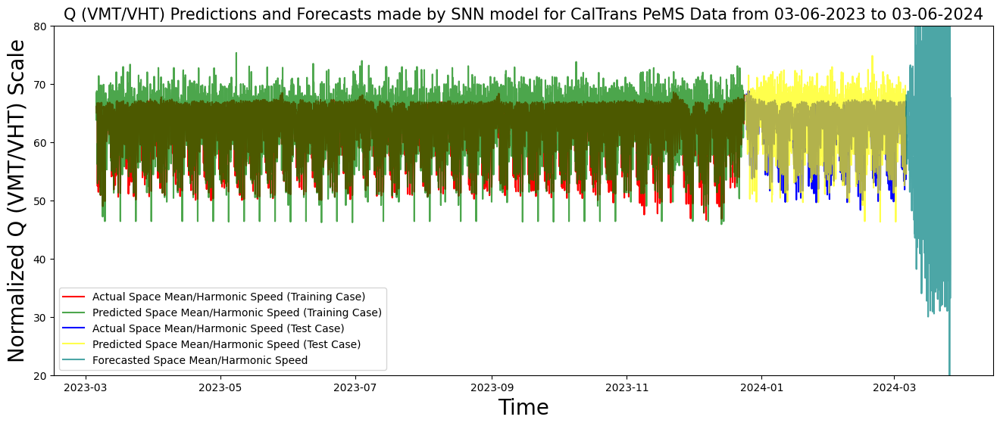

In [108]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_SNN_train, results_SNN_test, forecast_result_snn,
                   'SNN', title_name, min=20, max=80)

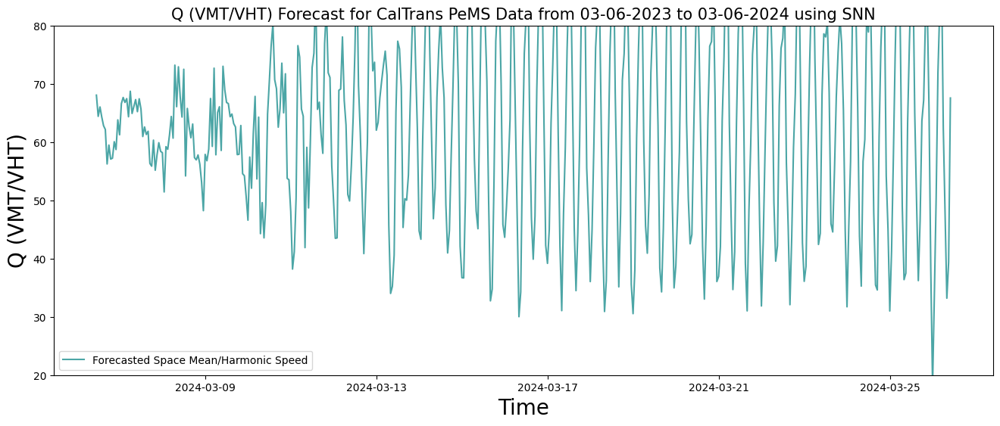

In [109]:
# Only Forecast Data for closer look.
plot_forecast( forecast_result_snn,
              'SNN', title_name, min=20, max=80)

# Creating a pickle file for all classifier models.

## Mount model_pkl folder.

In [110]:
#os.chdir('/content/drive/My Drive/VT/Research/TSC_datasets/model_pkl')

## Send model to pkl file.

In [111]:
#filename_rnn = 'TSC_apdatasets-prediction-spiking-model_vehicle_hours.pkl'
#pickle.dump(spiking_model, open(filename_rnn, 'wb'))

# Convert to PDF.

In [112]:
#!pip install nbconvert
#!apt-get-qq install texlive texlive-xetex texlive-latex-extra pandoc
#!pip install--quiet pypandoc

In [113]:
#!jupyter nbconvert --to latex TSC_pems_models_Spiking_v2.ipynb
#!jupyter nbconvert--to PDF "/content/drive/My Drive/VT/Research/TSC_datasets/TSC_Program_Implementation/PeMS Dataset/TSC_pems_models_Spiking_v2.ipynb"

In [114]:
#files.download('your_notebook_name.tex')